# RND Experiments with Pre-Computed Embeddings

This notebook provides an optimized framework for running RND experiments by **pre-computing embeddings once** and reusing them across multiple experiments.

## Key Advantages
- ⚡ **Massive speedup**: Encoding happens once, not every epoch
- 🎯 **Focus on RND**: Train RNDModule directly without encoder overhead
- 🔬 **Same experimental rigor**: All metrics, logs, and comparisons preserved
- 🔄 **Reusable embeddings**: Test multiple hyperparameters without re-encoding

## Workflow
1. **Pre-compute Embeddings** (Section 1): Encode dataset with all 3 encoders, save to disk
2. **Run Experiments** (Sections 2-4): Train RND models using cached embeddings
3. **Compare Results** (Section 5): Analyze performance across configurations

## Available Encoder Models
- **`'gte'`** → Alibaba-NLP/gte-modernbert-base
- **`'granite'`** → ibm-granite/granite-embedding-english-r2  
- **`'granite-small'`** → ibm-granite/granite-embedding-small-english-r2

# Section 1: Pre-Compute Embeddings

Run this section **once** to generate embeddings for all encoders. The embeddings will be saved to disk for reuse.

In [ ]:
import random
import json
import pickle
import time
from pathlib import Path
from datetime import datetime
from datasets import load_dataset
import torch
import torch.nn as nn
from torch.cuda.amp import autocast, GradScaler
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sys

# Add parent directory to path to import modules
sys.path.append('..')
from rnd import *

# Model name mapping
ENCODER_MODELS = {
    'granite': 'ibm-granite/granite-embedding-english-r2',
    'granite-small': 'ibm-granite/granite-embedding-small-english-r2',
    'gte': 'Alibaba-NLP/gte-modernbert-base'
}

def get_encoder_name(model_key):
    """Convert short model key to full model name."""
    if model_key in ENCODER_MODELS:
        return ENCODER_MODELS[model_key]
    return model_key

In [ ]:
def precompute_embeddings_for_encoder(
    encoder_name: str,
    dataset,
    num_samples: int,
    max_length: int = 2048,
    batch_size: int = 64,
    device: str = 'cuda',
    save_dir: str = 'embeddings'
):
    """
    Pre-compute embeddings for all problems and solutions using a specific encoder.
    
    Args:
        encoder_name: Short name ('gte', 'granite', 'granite-small') or full model name
        dataset: HuggingFace dataset with 'question', 'r1_solution_1', 'r1_solution_2', 'r1_solution_3'
        num_samples: Number of samples to encode
        max_length: Maximum sequence length for tokenization
        batch_size: Batch size for encoding
        device: 'cuda' or 'cpu'
        save_dir: Directory to save embeddings
    
    Returns:
        dict: Contains 'problem_embs', 'solution1_embs', 'solution2_embs', 'solution3_embs',
              'embedding_dim', 'encoder_name', 'num_samples'
    """
    full_encoder_name = get_encoder_name(encoder_name)
    print(f"\n{'='*70}")
    print(f"Pre-computing embeddings for: {encoder_name} -> {full_encoder_name}")
    print(f"{'='*70}")
    
    # Initialize encoder
    print(f"Loading encoder...")
    encoder = Encoder(model_name=full_encoder_name, device=device, max_length=max_length)
    embedding_dim = encoder.embedding_dim
    print(f"✓ Encoder loaded (embedding dim: {embedding_dim})")
    
    # Prepare data
    problems = list(dataset['question'][:num_samples])
    solution1 = list(dataset['r1_solution_1'][:num_samples])
    solution2 = list(dataset['r1_solution_2'][:num_samples])
    solution3 = list(dataset['r1_solution_3'][:num_samples])
    
    print(f"\nEncoding {num_samples} samples in batches of {batch_size}...")
    start_time = time.time()
    
    # Encode in batches
    problem_embs = []
    solution1_embs = []
    solution2_embs = []
    solution3_embs = []
    
    num_batches = (num_samples + batch_size - 1) // batch_size
    
    for batch_idx in range(num_batches):
        print("Encoding batch {}/{}...".format(batch_idx + 1, num_batches))
        start_idx = batch_idx * batch_size
        end_idx = min(start_idx + batch_size, num_samples)
        
        # Encode batch
        prob_batch = encoder.encode(problems[start_idx:end_idx])
        sol1_batch = encoder.encode(solution1[start_idx:end_idx])
        sol2_batch = encoder.encode(solution2[start_idx:end_idx])
        sol3_batch = encoder.encode(solution3[start_idx:end_idx])
        
        problem_embs.append(prob_batch.cpu())
        solution1_embs.append(sol1_batch.cpu())
        solution2_embs.append(sol2_batch.cpu())
        solution3_embs.append(sol3_batch.cpu())
        
        if device == 'cuda':
            torch.cuda.empty_cache()
        
        if (batch_idx + 1) % 10 == 0 or batch_idx == num_batches - 1:
            print(f"  Processed {end_idx}/{num_samples} samples...")
    
    # Concatenate all batches
    problem_embs = torch.cat(problem_embs, dim=0)
    solution1_embs = torch.cat(solution1_embs, dim=0)
    solution2_embs = torch.cat(solution2_embs, dim=0)
    solution3_embs = torch.cat(solution3_embs, dim=0)
    
    elapsed = time.time() - start_time
    print(f"\n✓ Encoding complete in {elapsed:.1f}s ({elapsed/num_samples:.3f}s per sample)")
    
    # Package results
    embeddings_data = {
        'problem_embs': problem_embs,
        'solution1_embs': solution1_embs,
        'solution2_embs': solution2_embs,
        'solution3_embs': solution3_embs,
        'embedding_dim': embedding_dim,
        'encoder_name': encoder_name,
        'encoder_full_name': full_encoder_name,
        'num_samples': num_samples,
        'max_length': max_length
    }
    
    # Save to disk
    Path(save_dir).mkdir(exist_ok=True)
    save_path = f"{save_dir}/embeddings_{encoder_name}_{num_samples}.pkl"
    
    print(f"\nSaving embeddings to {save_path}...")
    with open(save_path, 'wb') as f:
        pickle.dump(embeddings_data, f)
    
    # Calculate file size
    file_size_mb = Path(save_path).stat().st_size / (1024 * 1024)
    print(f"✓ Saved {file_size_mb:.2f} MB to disk")
    
    print(f"\n📊 Embedding shapes:")
    print(f"  Problems: {problem_embs.shape}")
    print(f"  Solution 1: {solution1_embs.shape}")
    print(f"  Solution 2: {solution2_embs.shape}")
    print(f"  Solution 3: {solution3_embs.shape}")
    
    return embeddings_data

In [ ]:
# Load dataset
print("Loading DeepMath-103K dataset...")
dataset = load_dataset("zwhe99/DeepMath-103K", split="train")
dataset = dataset.shuffle(seed=42)
print(f"✓ Dataset loaded: {len(dataset)} total samples\n")

# Configuration
NUM_SAMPLES = 12000  # Number of samples to encode
MAX_LENGTH = 512
BATCH_SIZE = 16
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
SAVE_DIR = 'embeddings'

print(f"Configuration:")
print(f"  Samples: {NUM_SAMPLES}")
print(f"  Max length: {MAX_LENGTH}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Device: {DEVICE}")
print(f"  Save directory: {SAVE_DIR}")

Loading DeepMath-103K dataset...
✓ Dataset loaded: 103022 total samples

Configuration:
  Samples: 12000
  Max length: 512
  Batch size: 16
  Device: cuda
  Save directory: embeddings
✓ Dataset loaded: 103022 total samples

Configuration:
  Samples: 12000
  Max length: 512
  Batch size: 16
  Device: cuda
  Save directory: embeddings


In [ ]:
# # Pre-compute embeddings for all 3 encoders
# all_embeddings = {}

# for encoder_key in ['gte', 'granite-small', 'granite']:
#     embeddings = precompute_embeddings_for_encoder(
#         encoder_name=encoder_key,
#         dataset=dataset,
#         num_samples=NUM_SAMPLES,
#         max_length=MAX_LENGTH,
#         batch_size=BATCH_SIZE,
#         device=DEVICE,
#         save_dir=SAVE_DIR
#     )
#     all_embeddings[encoder_key] = embeddings
#     print(f"\n{'='*70}\n")

# print("\n🎉 All embeddings pre-computed and saved!")
# print(f"\nSaved files:")
# for encoder_key in all_embeddings.keys():
#     filepath = f"{SAVE_DIR}/embeddings_{encoder_key}_{NUM_SAMPLES}.pkl"
#     print(f"  {filepath}")


Pre-computing embeddings for: gte -> Alibaba-NLP/gte-modernbert-base
Loading encoder...
[Encoder] loading model 'Alibaba-NLP/gte-modernbert-base' on device=cuda ...
[Encoder] loaded (embedding_dim=768)
✓ Encoder loaded (embedding dim: 768)
[Encoder] loaded (embedding_dim=768)
✓ Encoder loaded (embedding dim: 768)

Encoding 12000 samples in batches of 16...
Encoding batch 1/750...

Encoding 12000 samples in batches of 16...
Encoding batch 1/750...
Encoding batch 2/750...
Encoding batch 2/750...
Encoding batch 3/750...
Encoding batch 3/750...
Encoding batch 4/750...
Encoding batch 4/750...
Encoding batch 5/750...
Encoding batch 5/750...
Encoding batch 6/750...
Encoding batch 6/750...
Encoding batch 7/750...
Encoding batch 7/750...
Encoding batch 8/750...
Encoding batch 8/750...
Encoding batch 9/750...
Encoding batch 9/750...
Encoding batch 10/750...
Encoding batch 10/750...
  Processed 160/12000 samples...
Encoding batch 11/750...
  Processed 160/12000 samples...
Encoding batch 11/750..

# Section 2: Utility Functions

Load pre-computed embeddings and prepare them for experiments.

In [ ]:
def load_precomputed_embeddings(encoder_name: str, num_samples: int, save_dir: str = 'embeddings'):
    """
    Load pre-computed embeddings from disk.
    
    Args:
        encoder_name: Short name ('gte', 'granite', 'granite-small')
        num_samples: Number of samples (used in filename)
        save_dir: Directory where embeddings are saved
    
    Returns:
        dict: Contains 'problem_embs', 'solution1_embs', 'solution2_embs', 'solution3_embs',
              'embedding_dim', 'encoder_name', 'num_samples'
    """
    filepath = f"{save_dir}/embeddings_{encoder_name}_{num_samples}.pkl"
    
    if not Path(filepath).exists():
        raise FileNotFoundError(
            f"Embeddings file not found: {filepath}\n"
            f"Please run Section 1 to pre-compute embeddings first."
        )
    
    print(f"Loading embeddings from {filepath}...")
    with open(filepath, 'rb') as f:
        embeddings_data = pickle.load(f)
    
    file_size_mb = Path(filepath).stat().st_size / (1024 * 1024)
    print(f"✓ Loaded {file_size_mb:.2f} MB")
    print(f"✓ Embedding dim: {embeddings_data['embedding_dim']}")
    print(f"✓ Num samples: {embeddings_data['num_samples']}")
    
    return embeddings_data


def prepare_embeddings_for_training(embeddings_data, concat_problem_answer: bool = False):
    """
    Prepare embeddings for training by optionally concatenating problem and answer.
    
    Args:
        embeddings_data: Dict from load_precomputed_embeddings()
        concat_problem_answer: If True, concatenate problem and solution embeddings
    
    Returns:
        dict: Contains prepared 'train_embs' (sol1+sol2), 'eval_seen_embs' (sol1),
              'eval_unseen_embs' (sol3), 'embedding_dim'
    """
    problem_embs = embeddings_data['problem_embs']
    solution1_embs = embeddings_data['solution1_embs']
    solution2_embs = embeddings_data['solution2_embs']
    solution3_embs = embeddings_data['solution3_embs']
    
    if concat_problem_answer:
        # Concatenate problem and solution embeddings
        train_sol1_embs = torch.cat([problem_embs, solution1_embs], dim=1)
        train_sol2_embs = torch.cat([problem_embs, solution2_embs], dim=1)
        eval_seen_embs = torch.cat([problem_embs, solution1_embs], dim=1)
        eval_unseen_embs = torch.cat([problem_embs, solution3_embs], dim=1)
        final_dim = problem_embs.shape[1] * 2
    else:
        # Use only solution embeddings (problem info is implicit in solution)
        train_sol1_embs = solution1_embs
        train_sol2_embs = solution2_embs
        eval_seen_embs = solution1_embs
        eval_unseen_embs = solution3_embs
        final_dim = solution1_embs.shape[1]
    
    return {
        'train_sol1_embs': train_sol1_embs,
        'train_sol2_embs': train_sol2_embs,
        'eval_seen_embs': eval_seen_embs,
        'eval_unseen_embs': eval_unseen_embs,
        'embedding_dim': final_dim
    }

# Section 3: Core Training Functions

Functions for training and testing RND with pre-computed embeddings.

In [ ]:
def initialize_rnd_model(embedding_dim, target_layers, predictor_layers, normalize_embeddings, device):
    """Initialize RNDModule with given configuration."""
    print("\nInitializing RNDModule...")
    print(f"  Embedding dim: {embedding_dim}")
    print(f"  Target network: {target_layers}")
    print(f"  Predictor network: {predictor_layers}")
    print(f"  Normalize embeddings: {normalize_embeddings}")
    
    rnd_model = RNDModule(
        input_dim=embedding_dim,
        target_layers=target_layers,
        predictor_layers=predictor_layers,
        device=device,
        normalize_embeddings=normalize_embeddings
    ).to(device)
    
    print(f"✓ RNDModule initialized on {device}")
    return rnd_model


def train_rnd(rnd_model, prepared_embs, num_train_samples, num_epochs,
              learning_rate, batch_size, device):
    """
    Train the RND model using pre-computed embeddings.
    
    Args:
        rnd_model: RNDModule instance
        prepared_embs: Dict from prepare_embeddings_for_training()
        num_train_samples: Number of samples to use for training
        num_epochs: Number of training epochs
        learning_rate: Learning rate
        batch_size: Batch size
        device: Device to use
    
    Returns:
        dict: Training metrics including losses, rewards, MSE, ratios
    """
    train_sol1_embs = prepared_embs['train_sol1_embs'][:num_train_samples].to(device)
    train_sol2_embs = prepared_embs['train_sol2_embs'][:num_train_samples].to(device)
    eval_seen_embs = prepared_embs['eval_seen_embs'][:num_train_samples].to(device)
    eval_unseen_embs = prepared_embs['eval_unseen_embs'][:num_train_samples].to(device)
    
    optimizer = torch.optim.Adam(rnd_model.predictor_parameters(), lr=learning_rate)
    scaler = GradScaler()
    print("✓ Optimizer initialized.")
    
    # Prepare evaluation data once (fixed set for consistent tracking)
    print("\nPreparing evaluation data...")
    eval_size = min(100, num_train_samples)
    eval_seen = eval_seen_embs[:eval_size]
    eval_unseen = eval_unseen_embs[:eval_size]
    
    # Create random eval set
    eval_random_indices = torch.randperm(num_train_samples)[:eval_size]
    eval_random = eval_seen_embs[eval_random_indices]
    
    print(f"\nTraining RND for {num_epochs} epochs on {num_train_samples} samples...")
    print(f"Processing in batches of {batch_size} samples")
    print(f"Evaluating on {eval_size} samples after each epoch\n")
    
    # Track metrics for plotting
    training_losses = []
    epoch_rewards_s1 = []
    epoch_rewards_s3 = []
    epoch_rewards_rand = []
    epoch_mse_s1 = []
    epoch_mse_s3 = []
    epoch_mse_rand = []
    epoch_ratios = []
    
    for epoch in range(num_epochs):
        # ===== TRAINING PHASE =====
        rnd_model.train()
        epoch_losses = []
        
        num_batches = (num_train_samples + batch_size - 1) // batch_size
        
        # Shuffle training data each epoch
        perm = torch.randperm(num_train_samples)
        train_sol1_shuffled = train_sol1_embs[perm]
        train_sol2_shuffled = train_sol2_embs[perm]
        
        for batch_idx in range(num_batches):
            start_idx = batch_idx * batch_size
            end_idx = min(start_idx + batch_size, num_train_samples)
            
            # Create batch with both solution 1 and solution 2
            batch_sol1 = train_sol1_shuffled[start_idx:end_idx].unsqueeze(1)  # [B, 1, E]
            batch_sol2 = train_sol2_shuffled[start_idx:end_idx].unsqueeze(1)  # [B, 1, E]
            batch = torch.cat([batch_sol1, batch_sol2], dim=1)  # [B, 2, E]
            
            with autocast():
                _, loss = rnd_model(batch, update_stats=True)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            
            epoch_losses.append(loss.item())
            
            if device == 'cuda':
                torch.cuda.empty_cache()
        
        avg_epoch_loss = sum(epoch_losses) / len(epoch_losses)
        training_losses.append(avg_epoch_loss)
        
        # ===== EVALUATION PHASE =====
        rnd_model.eval()
        
        with torch.no_grad():
            # Evaluate on seen (solution 1), unseen (solution 3), and random
            eval_seen_batch = eval_seen.unsqueeze(1)  # [eval_size, 1, E]
            eval_unseen_batch = eval_unseen.unsqueeze(1)  # [eval_size, 1, E]
            eval_random_batch = eval_random.unsqueeze(1)  # [eval_size, 1, E]
            
            rewards_s1, mse_s1 = rnd_model(eval_seen_batch, update_stats=False)
            rewards_s3, mse_s3 = rnd_model(eval_unseen_batch, update_stats=False)
            rewards_rand, mse_rand = rnd_model(eval_random_batch, update_stats=False)
            
            # Extract values
            mean_r_s1 = rewards_s1.flatten().mean().item()
            mean_r_s3 = rewards_s3.flatten().mean().item()
            mean_r_rand = rewards_rand.flatten().mean().item()
            mean_mse_s1 = mse_s1.flatten().mean().item()
            mean_mse_s3 = mse_s3.flatten().mean().item()
            mean_mse_rand = mse_rand.flatten().mean().item()
        
        epoch_rewards_s1.append(mean_r_s1)
        epoch_rewards_s3.append(mean_r_s3)
        epoch_rewards_rand.append(mean_r_rand)
        epoch_mse_s1.append(mean_mse_s1)
        epoch_mse_s3.append(mean_mse_s3)
        epoch_mse_rand.append(mean_mse_rand)
        
        ratio = mean_mse_s3 / (mean_mse_s1 + 1e-8)
        epoch_ratios.append(ratio)
        
        if (epoch + 1) % 5 == 0 or epoch == 0 or epoch == num_epochs - 1:
            print(f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_epoch_loss:.6f} | "
                  f"R_seen: {mean_r_s1:.4f} | R_unseen: {mean_r_s3:.4f} | R_random: {mean_r_rand:.4f} | "
                  f"MSE_seen: {mean_mse_s1:.4f} | MSE_unseen: {mean_mse_s3:.4f} | MSE_random: {mean_mse_rand:.4f} | "
                  f"Ratio: {ratio:.2f}x")
    
    print("\n✓ Training complete!")
    
    return {
        'training_losses': training_losses,
        'epoch_rewards_s1': epoch_rewards_s1,
        'epoch_rewards_s3': epoch_rewards_s3,
        'epoch_rewards_rand': epoch_rewards_rand,
        'epoch_mse_s1': epoch_mse_s1,
        'epoch_mse_s3': epoch_mse_s3,
        'epoch_mse_rand': epoch_mse_rand,
        'epoch_ratios': epoch_ratios
    }

In [ ]:
def test_rnd(rnd_model, prepared_embs, num_train_samples, batch_size, device):
    """
    Test the trained RND model on all training samples.
    
    Args:
        rnd_model: Trained RNDModule instance
        prepared_embs: Dict from prepare_embeddings_for_training()
        num_train_samples: Number of samples to test on
        batch_size: Batch size for testing
        device: Device to use
    
    Returns:
        dict: Test results with mean/std for rewards and MSE
    """
    print("\n--- Testing RND Rewards ---")
    print(f"Processing {num_train_samples} test samples in batches of {batch_size}...")
    rnd_model.eval()
    
    eval_seen_embs = prepared_embs['eval_seen_embs'][:num_train_samples].to(device)
    eval_unseen_embs = prepared_embs['eval_unseen_embs'][:num_train_samples].to(device)
    
    # Create random test set
    random_indices = torch.randperm(num_train_samples)
    eval_random_embs = eval_seen_embs[random_indices]
    
    all_rewards_s1 = []
    all_rewards_s3 = []
    all_rewards_rand = []
    all_mse_s1 = []
    all_mse_s3 = []
    all_mse_rand = []
    
    num_test_batches = (num_train_samples + batch_size - 1) // batch_size
    
    with torch.no_grad():
        for batch_idx in range(num_test_batches):
            start_idx = batch_idx * batch_size
            end_idx = min(start_idx + batch_size, num_train_samples)
            
            batch_seen = eval_seen_embs[start_idx:end_idx].unsqueeze(1)  # [B, 1, E]
            batch_unseen = eval_unseen_embs[start_idx:end_idx].unsqueeze(1)  # [B, 1, E]
            batch_random = eval_random_embs[start_idx:end_idx].unsqueeze(1)  # [B, 1, E]
            
            rewards_s1, mse_s1 = rnd_model(batch_seen, update_stats=False)
            rewards_s3, mse_s3 = rnd_model(batch_unseen, update_stats=False)
            rewards_rand, mse_rand = rnd_model(batch_random, update_stats=False)
            
            all_rewards_s1.append(rewards_s1.flatten().cpu())
            all_rewards_s3.append(rewards_s3.flatten().cpu())
            all_rewards_rand.append(rewards_rand.flatten().cpu())
            all_mse_s1.append(mse_s1.flatten().cpu())
            all_mse_s3.append(mse_s3.flatten().cpu())
            all_mse_rand.append(mse_rand.flatten().cpu())
            
            if device == 'cuda':
                torch.cuda.empty_cache()
            
            if (batch_idx + 1) % 5 == 0 or batch_idx == num_test_batches - 1:
                print(f"  Processed {end_idx}/{num_train_samples} samples...")
    
    all_rewards_s1 = torch.cat(all_rewards_s1)
    all_rewards_s3 = torch.cat(all_rewards_s3)
    all_rewards_rand = torch.cat(all_rewards_rand)
    all_mse_s1 = torch.cat(all_mse_s1)
    all_mse_s3 = torch.cat(all_mse_s3)
    all_mse_rand = torch.cat(all_mse_rand)
    
    return {
        'mean_reward_s1': all_rewards_s1.mean().item(),
        'mean_reward_s3': all_rewards_s3.mean().item(),
        'mean_reward_rand': all_rewards_rand.mean().item(),
        'mean_mse_s1': all_mse_s1.mean().item(),
        'mean_mse_s3': all_mse_s3.mean().item(),
        'mean_mse_rand': all_mse_rand.mean().item(),
        'std_reward_s1': all_rewards_s1.std().item(),
        'std_reward_s3': all_rewards_s3.std().item(),
        'std_reward_rand': all_rewards_rand.std().item(),
        'std_mse_s1': all_mse_s1.std().item(),
        'std_mse_s3': all_mse_s3.std().item(),
        'std_mse_rand': all_mse_rand.std().item(),
    }

In [ ]:
def analyze_and_visualize(training_metrics, test_results, hyperparams, save_dir='results'):
    """Analyze results, create visualizations, and save to JSON - identical to original."""
    
    # Extract metrics
    training_losses = training_metrics['training_losses']
    epoch_rewards_s1 = training_metrics['epoch_rewards_s1']
    epoch_rewards_s3 = training_metrics['epoch_rewards_s3']
    epoch_rewards_rand = training_metrics['epoch_rewards_rand']
    epoch_mse_s1 = training_metrics['epoch_mse_s1']
    epoch_mse_s3 = training_metrics['epoch_mse_s3']
    epoch_mse_rand = training_metrics['epoch_mse_rand']
    epoch_ratios = training_metrics['epoch_ratios']
    
    mean_reward_s1 = test_results['mean_reward_s1']
    mean_reward_s3 = test_results['mean_reward_s3']
    mean_reward_rand = test_results['mean_reward_rand']
    mean_mse_s1 = test_results['mean_mse_s1']
    mean_mse_s3 = test_results['mean_mse_s3']
    mean_mse_rand = test_results['mean_mse_rand']
    std_reward_s1 = test_results['std_reward_s1']
    std_reward_s3 = test_results['std_reward_s3']
    std_reward_rand = test_results['std_reward_rand']
    std_mse_s1 = test_results['std_mse_s1']
    std_mse_s3 = test_results['std_mse_s3']
    std_mse_rand = test_results['std_mse_rand']
    
    # Calculate ratios
    ratio_unseen_vs_seen = mean_mse_s3 / (mean_mse_s1 + 1e-8)
    ratio_random_vs_seen = mean_mse_rand / (mean_mse_s1 + 1e-8)
    ratio_unseen_vs_random = mean_mse_s3 / (mean_mse_rand + 1e-8)
    
    # Print results
    print("\n" + "="*70)
    print(" EXPERIMENT RESULTS: RND Intrinsic Reward Analysis")
    print("="*70)
    
    print("\n📊 Average Intrinsic Rewards:")
    print(f"  Trained Solutions (Sol 1): {mean_reward_s1:.6f} ± {std_reward_s1:.6f}  (Expected: LOW)")
    print(f"  Unseen Path (Sol 3):       {mean_reward_s3:.6f} ± {std_reward_s3:.6f}  (Expected: HIGH)")
    print(f"  Random Solution (Control): {mean_reward_rand:.6f} ± {std_reward_rand:.6f}  (Expected: HIGH)")
    
    print("\n📊 Average MSE:")
    print(f"  Trained Solutions (Sol 1): {mean_mse_s1:.6f} ± {std_mse_s1:.6f}  (Expected: LOW)")
    print(f"  Unseen Path (Sol 3):       {mean_mse_s3:.6f} ± {std_mse_s3:.6f}  (Expected: HIGH)")
    print(f"  Random Solution (Control): {mean_mse_rand:.6f} ± {std_mse_rand:.6f}  (Expected: HIGH)")
    
    print("\n📈 MSE Ratios (Higher = Better Novelty Detection):")
    print(f"  Unseen / Seen:   {ratio_unseen_vs_seen:.3f}x")
    print(f"  Random / Seen:   {ratio_random_vs_seen:.3f}x")
    print(f"  Unseen / Random: {ratio_unseen_vs_random:.3f}x")
    
    # --- Visualization ---
    print("\n📊 Generating training curves...")
    
    fig, axes = plt.subplots(3, 2, figsize=(16, 18))
    epochs_range = range(1, len(training_losses) + 1)
    
    # Plot 1: Training Loss
    axes[0, 0].plot(epochs_range, training_losses, linewidth=2, color='#2E86AB', marker='o', markersize=3)
    axes[0, 0].set_xlabel('Epoch', fontsize=12, fontweight='bold')
    axes[0, 0].set_ylabel('Predictor MSE Loss', fontsize=12, fontweight='bold')
    axes[0, 0].set_title('RND Training Loss', fontsize=14, fontweight='bold')
    axes[0, 0].grid(True, alpha=0.3, linestyle='--')
    
    if len(training_losses) > 1:
        loss_reduction = ((training_losses[0] - training_losses[-1]) / training_losses[0]) * 100
        axes[0, 0].annotate(f'Loss ↓ {loss_reduction:.1f}%', 
                            xy=(len(training_losses) * 0.6, max(training_losses) * 0.8),
                            fontsize=11, 
                            bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.3))
    
    # Plot 2: Reward Evolution
    axes[0, 1].plot(epochs_range, epoch_rewards_s1, linewidth=2, color='#A23B72', marker='o', markersize=3, label='Seen', alpha=0.8)
    axes[0, 1].plot(epochs_range, epoch_rewards_s3, linewidth=2, color='#F18F01', marker='s', markersize=3, label='Unseen', alpha=0.8)
    axes[0, 1].plot(epochs_range, epoch_rewards_rand, linewidth=2, color='#C73E1D', marker='^', markersize=3, label='Random', alpha=0.8)
    axes[0, 1].set_xlabel('Epoch', fontsize=12, fontweight='bold')
    axes[0, 1].set_ylabel('Mean Intrinsic Reward', fontsize=12, fontweight='bold')
    axes[0, 1].set_title('Reward Evolution', fontsize=14, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=10)
    axes[0, 1].grid(True, alpha=0.3, linestyle='--')
    
    # Plot 3: MSE Evolution
    axes[1, 0].plot(epochs_range, epoch_mse_s1, linewidth=2, color='#A23B72', marker='o', markersize=3, label='Seen', alpha=0.8)
    axes[1, 0].plot(epochs_range, epoch_mse_s3, linewidth=2, color='#F18F01', marker='s', markersize=3, label='Unseen', alpha=0.8)
    axes[1, 0].plot(epochs_range, epoch_mse_rand, linewidth=2, color='#C73E1D', marker='^', markersize=3, label='Random', alpha=0.8)
    axes[1, 0].set_xlabel('Epoch', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('Mean MSE', fontsize=12, fontweight='bold')
    axes[1, 0].set_title('MSE Evolution', fontsize=14, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=10)
    axes[1, 0].grid(True, alpha=0.3, linestyle='--')
    
    # Plot 4: Ratio Over Time
    axes[1, 1].plot(epochs_range, epoch_ratios, linewidth=2.5, color='#06A77D', marker='D', markersize=4)
    axes[1, 1].axhline(y=1.0, color='red', linestyle='--', alpha=0.5, linewidth=1.5, label='No discrimination')
    axes[1, 1].axhline(y=1.5, color='green', linestyle='--', alpha=0.5, linewidth=1.5, label='Good threshold')
    axes[1, 1].set_xlabel('Epoch', fontsize=12, fontweight='bold')
    axes[1, 1].set_ylabel('Unseen / Seen Ratio (MSE)', fontsize=12, fontweight='bold')
    axes[1, 1].set_title('Novelty Detection Ratio', fontsize=14, fontweight='bold')
    axes[1, 1].legend(loc='best', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3, linestyle='--')
    
    # Plot 5: Final Reward Comparison
    categories = ['Seen', 'Unseen', 'Random']
    means = [mean_reward_s1, mean_reward_s3, mean_reward_rand]
    stds = [std_reward_s1, std_reward_s3, std_reward_rand]
    colors = ['#A23B72', '#F18F01', '#C73E1D']
    
    bars = axes[2, 0].bar(categories, means, yerr=stds, capsize=5, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
    axes[2, 0].set_ylabel('Intrinsic Reward', fontsize=12, fontweight='bold')
    axes[2, 0].set_title('Final Reward Comparison', fontsize=14, fontweight='bold')
    axes[2, 0].grid(True, alpha=0.3, linestyle='--', axis='y')
    
    for bar, mean, std in zip(bars, means, stds):
        height = bar.get_height()
        axes[2, 0].text(bar.get_x() + bar.get_width()/2., height + std + 0.05,
                        f'{mean:.3f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
    
    # Plot 6: Final MSE Comparison
    mse_means = [mean_mse_s1, mean_mse_s3, mean_mse_rand]
    mse_stds = [std_mse_s1, std_mse_s3, std_mse_rand]
    
    bars_mse = axes[2, 1].bar(categories, mse_means, yerr=mse_stds, capsize=5, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
    axes[2, 1].set_ylabel('MSE', fontsize=12, fontweight='bold')
    axes[2, 1].set_title('Final MSE Comparison', fontsize=14, fontweight='bold')
    axes[2, 1].grid(True, alpha=0.3, linestyle='--', axis='y')
    
    for bar, mean, std in zip(bars_mse, mse_means, mse_stds):
        height = bar.get_height()
        axes[2, 1].text(bar.get_x() + bar.get_width()/2., height + std + 0.05,
                        f'{mean:.4f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
    
    plt.tight_layout()
    
    # Generate filename
    Path(save_dir).mkdir(exist_ok=True)
    norm_str = "norm" if hyperparams['normalize_embeddings'] else "nonorm"
    target_str = "_".join(map(str, hyperparams['target_layers']))
    predictor_str = "_".join(map(str, hyperparams['predictor_layers']))
    concat_str = "concat" if hyperparams['concat_problem_answer'] else "noconcat"
    encoder_str = hyperparams['encoder_name']  # Use short name in filename
    
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_name = (f"precomp_{encoder_str}_"
                 f"train{hyperparams['num_train_samples']}_"
                 f"ep{hyperparams['num_epochs']}_"
                 f"lr{hyperparams['learning_rate']}_"
                 f"bs{hyperparams['batch_size']}_"
                 f"T{target_str}_P{predictor_str}_"
                 f"{norm_str}_{concat_str}")
    
    plot_filename = f"{save_dir}/plot_{base_name}_{timestamp}.png"
    plt.savefig(plot_filename, dpi=150, bbox_inches='tight')
    print(f"✓ Plot saved as '{plot_filename}'")
    plt.show()
    
    # Prepare JSON output (store both short name and full name)
    analysis_results = {
        'hyperparameters': hyperparams,
        'encoder_full_name': get_encoder_name(hyperparams['encoder_name']),
        'timestamp': timestamp,
        'training_logs': {
            'training_losses': training_losses,
            'epoch_rewards_s1': epoch_rewards_s1,
            'epoch_rewards_s3': epoch_rewards_s3,
            'epoch_rewards_rand': epoch_rewards_rand,
            'epoch_mse_s1': epoch_mse_s1,
            'epoch_mse_s3': epoch_mse_s3,
            'epoch_mse_rand': epoch_mse_rand,
            'epoch_ratios': epoch_ratios,
        },
        'training_metrics': {
            'initial_loss': training_losses[0],
            'final_loss': training_losses[-1],
            'loss_reduction_pct': ((training_losses[0] - training_losses[-1]) / training_losses[0]) * 100 if len(training_losses) > 1 else 0,
            'initial_ratio': epoch_ratios[0],
            'final_ratio': epoch_ratios[-1],
            'ratio_improvement_pct': ((epoch_ratios[-1] - epoch_ratios[0]) / epoch_ratios[0] * 100) if len(epoch_ratios) > 0 else 0,
        },
        'test_results': {
            'rewards': {
                'seen_mean': mean_reward_s1,
                'seen_std': std_reward_s1,
                'unseen_mean': mean_reward_s3,
                'unseen_std': std_reward_s3,
                'random_mean': mean_reward_rand,
                'random_std': std_reward_rand,
            },
            'mse': {
                'seen_mean': mean_mse_s1,
                'seen_std': std_mse_s1,
                'unseen_mean': mean_mse_s3,
                'unseen_std': std_mse_s3,
                'random_mean': mean_mse_rand,
                'random_std': std_mse_rand,
            },
            'ratios': {
                'unseen_vs_seen': ratio_unseen_vs_seen,
                'random_vs_seen': ratio_random_vs_seen,
                'unseen_vs_random': ratio_unseen_vs_random,
            }
        },
        'interpretation': {
            'novelty_detection': 'strong' if ratio_unseen_vs_seen > 1.5 else ('moderate' if ratio_unseen_vs_seen > 1.1 else 'weak'),
            'predictor_learned': epoch_mse_s1[-1] < epoch_mse_s1[0] if len(epoch_mse_s1) > 0 else False,
            'discrimination_improved': epoch_ratios[-1] > epoch_ratios[0] if len(epoch_ratios) > 0 else False,
        }
    }
    
    # Save JSON
    json_filename = f"{save_dir}/results_{base_name}_{timestamp}.json"
    with open(json_filename, 'w') as f:
        json.dump(analysis_results, f, indent=2)
    print(f"✓ Results saved to '{json_filename}'")
    
    print("\n" + "="*70)
    print("Experiment complete.")
    print("="*70)
    
    return analysis_results

def run_rnd_experiment_precomputed(
    # Data parameters
    num_train_samples=1000,
    
    # Model parameters
    encoder_name='gte',  # Short name: 'granite', 'granite-small', or 'gte'
    target_layers=(256, 128, 64),
    predictor_layers=(512, 256, 64),
    normalize_embeddings=True,
    concat_problem_answer=False,
    
    # Training parameters
    num_epochs=50,
    learning_rate=1e-4,
    batch_size=50,
    
    # Other parameters
    device=None,
    save_dir='results',
    embeddings_dir='embeddings',
    seed=42
):
    """
    Run a complete RND experiment using pre-computed embeddings.
    
    This is the main entry point - similar to run_rnd_experiment() but uses cached embeddings.
    """
    
    if device is None:
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # Set random seeds
    random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    
    # Package hyperparameters
    hyperparams = {
        'num_train_samples': num_train_samples,
        'encoder_name': encoder_name,
        'target_layers': target_layers,
        'predictor_layers': predictor_layers,
        'normalize_embeddings': normalize_embeddings,
        'concat_problem_answer': concat_problem_answer,
        'num_epochs': num_epochs,
        'learning_rate': learning_rate,
        'batch_size': batch_size,
        'device': device,
        'seed': seed
    }
    
    print("\n" + "="*70)
    print("STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)")
    print("="*70)
    print("\n📋 Hyperparameters:")
    for key, value in hyperparams.items():
        if key == 'encoder_name':
            full_name = get_encoder_name(value)
            print(f"  {key}: {value} ({full_name})")
        else:
            print(f"  {key}: {value}")
    print("="*70)
    
    # Step 1: Load pre-computed embeddings
    embeddings_data = load_precomputed_embeddings(encoder_name, num_train_samples, embeddings_dir)
    
    # Step 2: Prepare embeddings
    prepared_embs = prepare_embeddings_for_training(embeddings_data, concat_problem_answer)
    
    # Step 3: Initialize RND model
    rnd_model = initialize_rnd_model(
        embedding_dim=prepared_embs['embedding_dim'],
        target_layers=target_layers,
        predictor_layers=predictor_layers,
        normalize_embeddings=normalize_embeddings,
        device=device
    )
    
    # Step 4: Initialize embedding normalizer if enabled
    if normalize_embeddings:
        print("\nInitializing embedding normalizer with training data...")
        # Use first 200 samples from both solutions for initialization
        init_size = min(200, num_train_samples)
        init_sol1 = prepared_embs['train_sol1_embs'][:init_size].to(device)
        init_sol2 = prepared_embs['train_sol2_embs'][:init_size].to(device)
        init_data = torch.cat([init_sol1, init_sol2], dim=0)  # [400, E]
        rnd_model.initialize_embedding_normalizer(init_data)
        print("✓ Embedding normalizer initialized and frozen")
    
    # Step 5: Train model
    training_metrics = train_rnd(
        rnd_model, prepared_embs, num_train_samples,
        num_epochs, learning_rate, batch_size, device
    )
    
    # Step 6: Test model
    test_results = test_rnd(
        rnd_model, prepared_embs, num_train_samples, batch_size, device
    )
    
    # Step 7: Analyze and visualize
    analysis_results = analyze_and_visualize(
        training_metrics, test_results, hyperparams, save_dir
    )
    
    return analysis_results


# Batch Experiments: Run Multiple Configurations

Run multiple experiments with different hyperparameters using pre-computed embeddings.
Each experiment will be saved individually and a combined summary will be maintained.


📂 Found existing summary file: results/precomp_all_experiments_summary.json
✓ Loaded 2 previous experiment(s)
✓ Completed experiments: {'gte_eq_medium_t64-p64', 'gte_eq_small_t32-p32'}

⏭️  Skipping 'gte_eq_medium_t64-p64' (already completed)

Running Experiment 2/30: gte_eq_small_t8-p8
🕐 Started at: 2025-11-18 05:36:20


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 8)
  predictor_layers: (128, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...

STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 8)
  predictor_layers: (128, 8)
  normalize_embeddings: True
  concat_problem_answer: F

C:\Users\spand\AppData\Local\Temp\ipykernel_12392\1132188148.py:44: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
C:\Users\spand\AppData\Local\Temp\ipykernel_12392\1132188148.py:92: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Loss: 0.039618 | R_seen: -0.5828 | R_unseen: -0.5550 | R_random: -0.5754 | MSE_seen: 0.0211 | MSE_unseen: 0.0220 | MSE_random: 0.0213 | Ratio: 1.04x
Epoch 5/50 | Loss: 0.010785 | R_seen: -0.4965 | R_unseen: -0.4392 | R_random: -0.4860 | MSE_seen: 0.0097 | MSE_unseen: 0.0108 | MSE_random: 0.0099 | Ratio: 1.11x
Epoch 5/50 | Loss: 0.010785 | R_seen: -0.4965 | R_unseen: -0.4392 | R_random: -0.4860 | MSE_seen: 0.0097 | MSE_unseen: 0.0108 | MSE_random: 0.0099 | Ratio: 1.11x
Epoch 10/50 | Loss: 0.007459 | R_seen: -0.4555 | R_unseen: -0.3473 | R_random: -0.4404 | MSE_seen: 0.0070 | MSE_unseen: 0.0086 | MSE_random: 0.0073 | Ratio: 1.23x
Epoch 10/50 | Loss: 0.007459 | R_seen: -0.4555 | R_unseen: -0.3473 | R_random: -0.4404 | MSE_seen: 0.0070 | MSE_unseen: 0.0086 | MSE_random: 0.0073 | Ratio: 1.23x
Epoch 15/50 | Loss: 0.006035 | R_seen: -0.4362 | R_unseen: -0.3146 | R_random: -0.4340 | MSE_seen: 0.0058 | MSE_unseen: 0.0074 | MSE_random: 0.0058 | Ratio: 1.27x
Epoch 15/50 | Loss: 0.006

C:\Users\spand\AppData\Local\Temp\ipykernel_12392\3437759756.py:132: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


✓ Plot saved as 'results/plot_precomp_gte_train12000_ep50_lr0.0001_bs50_T128_8_P128_8_norm_noconcat_20251118_053830.png'


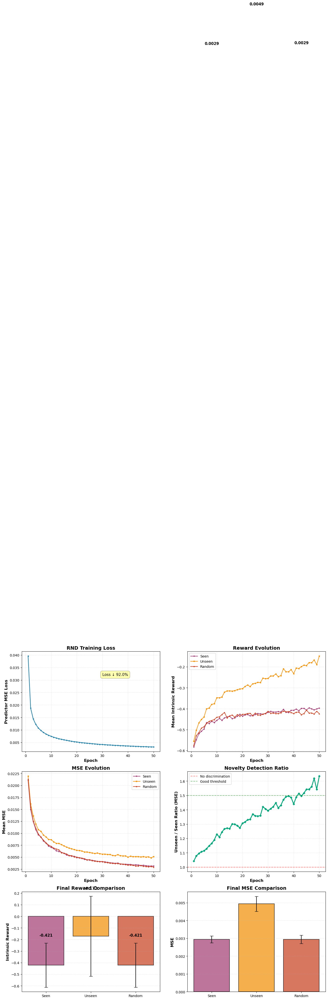

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T128_8_P128_8_norm_noconcat_20251118_053830.json'

Experiment complete.

✅ Experiment 'gte_eq_small_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 05:38:35
⏱️  Duration: 2m 14s (135.0s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 3 experiments)

Running Experiment 3/30: gte_eq_wide_t64-p64
🕐 Started at: 2025-11-18 05:38:35


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (512, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target network: (512, 64)
  

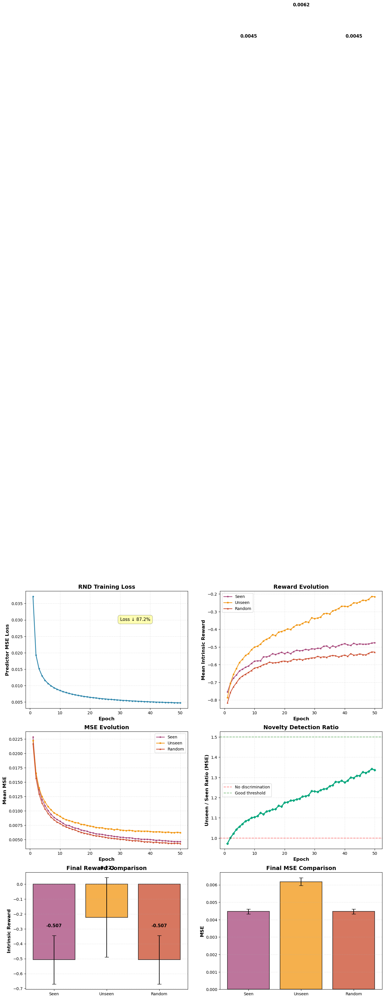

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T512_64_P512_64_norm_noconcat_20251118_054053.json'

Experiment complete.

✅ Experiment 'gte_eq_wide_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:40:57
⏱️  Duration: 2m 22s (142.1s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 4 experiments)

Running Experiment 4/30: gte_eq_deep_t64-p64
🕐 Started at: 2025-11-18 05:40:57


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (512, 256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target network:

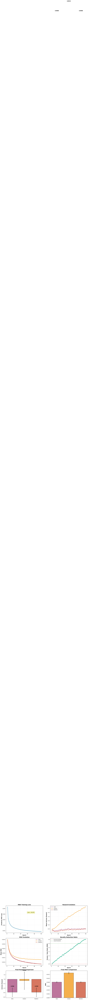

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T512_256_64_P512_256_64_norm_noconcat_20251118_054334.json'

Experiment complete.

✅ Experiment 'gte_eq_deep_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:43:42
⏱️  Duration: 2m 44s (164.5s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 5 experiments)

Running Experiment 5/30: gte_predlarge_mod_t64-p64
🕐 Started at: 2025-11-18 05:43:42


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target netw

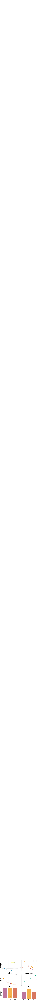

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T128_64_P512_64_norm_noconcat_20251118_054604.json'

Experiment complete.

✅ Experiment 'gte_predlarge_mod_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:46:19
⏱️  Duration: 2m 37s (157.6s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 6 experiments)

Running Experiment 6/30: gte_predlarge_big_t64-p64
🕐 Started at: 2025-11-18 05:46:19


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (256, 64)
  predictor_layers: (1024, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target netwo

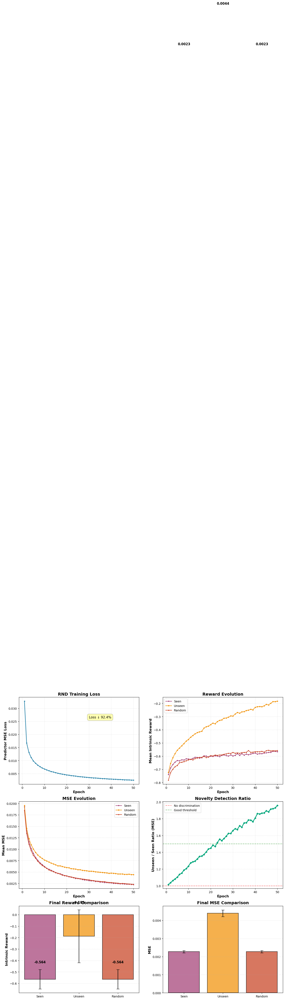

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T256_64_P1024_64_norm_noconcat_20251118_054858.json'

Experiment complete.

✅ Experiment 'gte_predlarge_big_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:49:03
⏱️  Duration: 2m 43s (163.6s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 7 experiments)

Running Experiment 7/30: gte_extreme_ultra_t64-p64
🕐 Started at: 2025-11-18 05:49:03


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 64)
  predictor_layers: (2048, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target netw

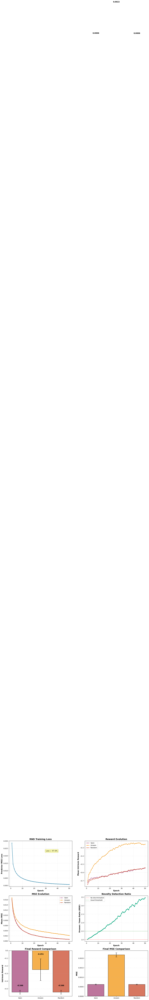

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T128_64_P2048_64_norm_noconcat_20251118_055131.json'

Experiment complete.

✅ Experiment 'gte_extreme_ultra_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:51:37
⏱️  Duration: 2m 34s (154.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 8 experiments)

Running Experiment 8/30: gte_deep_pred_t64-p64
🕐 Started at: 2025-11-18 05:51:37


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target netw

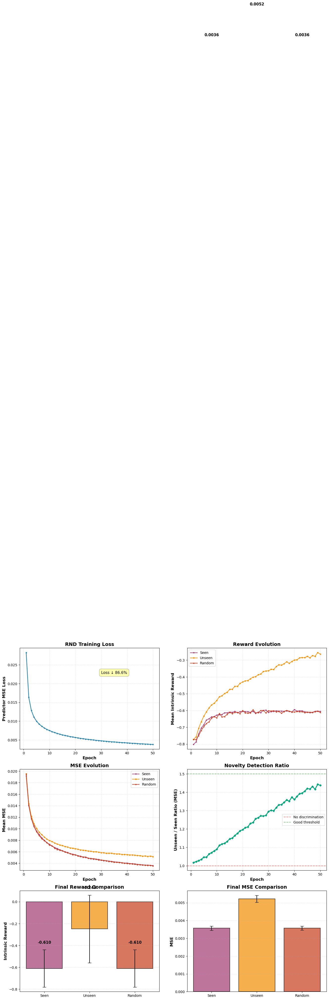

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T256_64_P512_256_64_norm_noconcat_20251118_055438.json'

Experiment complete.

✅ Experiment 'gte_deep_pred_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:54:43
⏱️  Duration: 3m 5s (185.5s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 9 experiments)

Running Experiment 9/30: gte_deep_both_t64-p64
🕐 Started at: 2025-11-18 05:54:43


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (512, 256, 64)
  predictor_layers: (1024, 512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target 

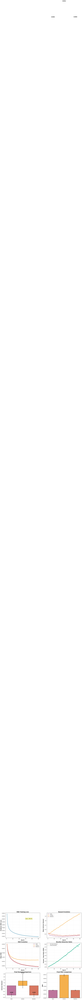

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T512_256_64_P1024_512_64_norm_noconcat_20251118_055801.json'

Experiment complete.

✅ Experiment 'gte_deep_both_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 05:58:10
⏱️  Duration: 3m 27s (207.4s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 10 experiments)

Running Experiment 10/30: gte_narrow_t8-p8
🕐 Started at: 2025-11-18 05:58:10


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 8)
  predictor_layers: (256, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Target network: (

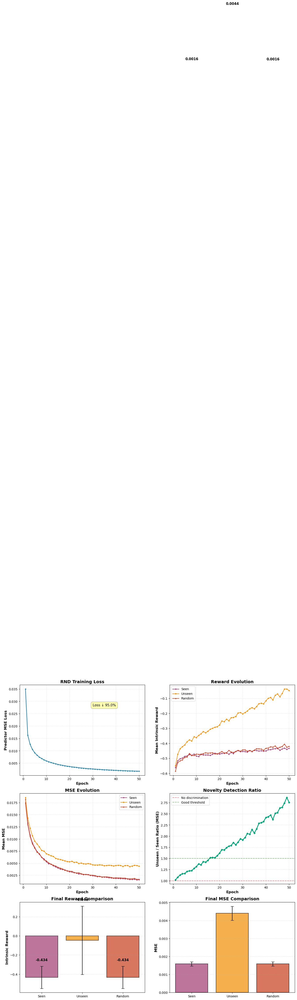

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T128_8_P256_8_norm_noconcat_20251118_060037.json'

Experiment complete.

✅ Experiment 'gte_narrow_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 06:00:43
⏱️  Duration: 2m 32s (152.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 11 experiments)

Running Experiment 11/30: granite_eq_medium_t64-p64
🕐 Started at: 2025-11-18 06:00:43


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (256, 64)
  predictor_layers: (256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768
  Targe

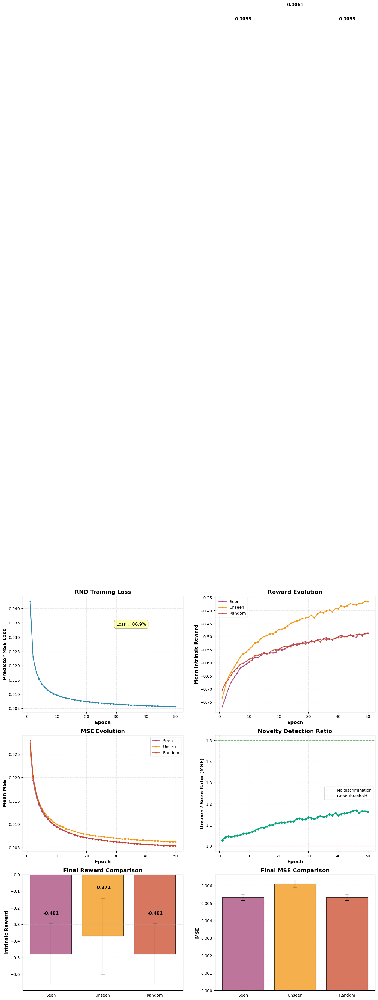

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T256_64_P256_64_norm_noconcat_20251118_060257.json'

Experiment complete.

✅ Experiment 'granite_eq_medium_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:03:02
⏱️  Duration: 2m 19s (139.1s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 12 experiments)

Running Experiment 12/30: granite_eq_small_t8-p8
🕐 Started at: 2025-11-18 06:03:02


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (128, 8)
  predictor_layers: (128, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 7

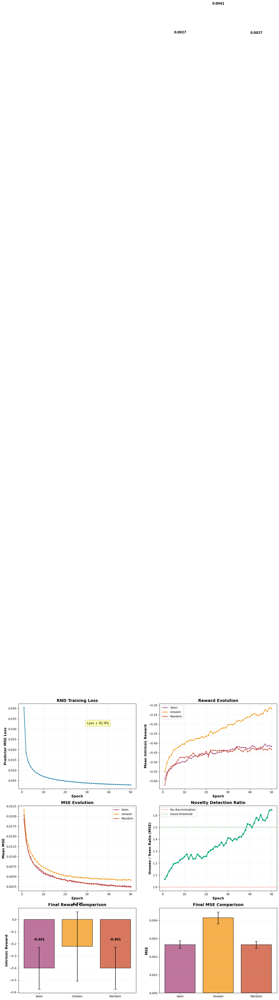

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T128_8_P128_8_norm_noconcat_20251118_060529.json'

Experiment complete.

✅ Experiment 'granite_eq_small_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 06:05:35
⏱️  Duration: 2m 32s (152.9s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 13 experiments)

Running Experiment 13/30: granite_eq_wide_t64-p64
🕐 Started at: 2025-11-18 06:05:35


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (512, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding dim: 768

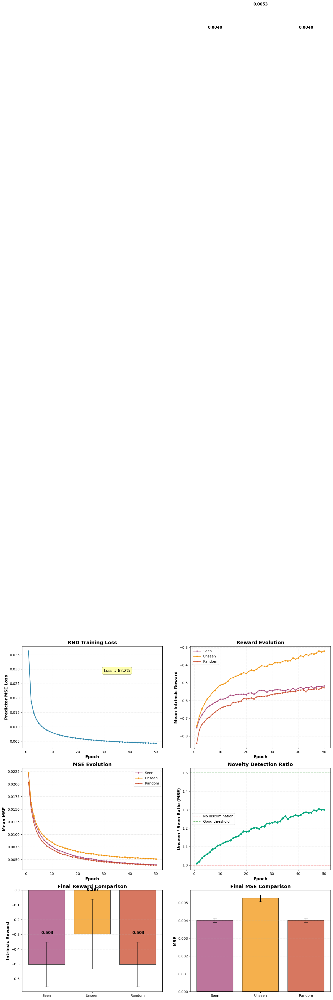

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T512_64_P512_64_norm_noconcat_20251118_060812.json'

Experiment complete.

✅ Experiment 'granite_eq_wide_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:08:16
⏱️  Duration: 2m 41s (161.7s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 14 experiments)

Running Experiment 14/30: granite_eq_deep_t64-p64
🕐 Started at: 2025-11-18 06:08:17


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (512, 256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embed

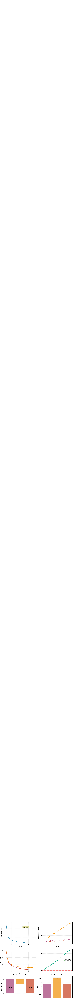

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T512_256_64_P512_256_64_norm_noconcat_20251118_061123.json'

Experiment complete.

✅ Experiment 'granite_eq_deep_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:11:33
⏱️  Duration: 3m 16s (196.4s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 15 experiments)

Running Experiment 15/30: granite_predlarge_mod_t64-p64
🕐 Started at: 2025-11-18 06:11:33


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (128, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  E

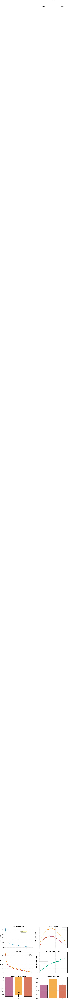

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T128_64_P512_64_norm_noconcat_20251118_061410.json'

Experiment complete.

✅ Experiment 'granite_predlarge_mod_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:14:20
⏱️  Duration: 2m 47s (167.5s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 16 experiments)

Running Experiment 16/30: granite_predlarge_big_t64-p64
🕐 Started at: 2025-11-18 06:14:21


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (256, 64)
  predictor_layers: (1024, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Em

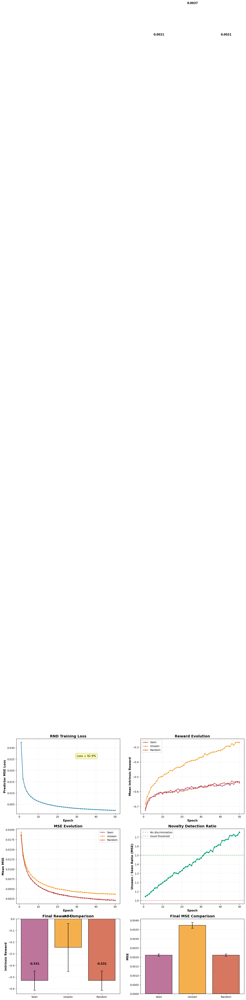

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T256_64_P1024_64_norm_noconcat_20251118_061705.json'

Experiment complete.

✅ Experiment 'granite_predlarge_big_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:17:11
⏱️  Duration: 2m 50s (170.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 17 experiments)

Running Experiment 17/30: granite_extreme_ultra_t64-p64
🕐 Started at: 2025-11-18 06:17:11


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (128, 64)
  predictor_layers: (2048, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  E

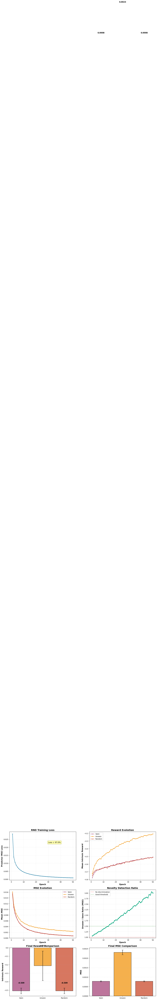

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T128_64_P2048_64_norm_noconcat_20251118_061939.json'

Experiment complete.

✅ Experiment 'granite_extreme_ultra_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:19:45
⏱️  Duration: 2m 34s (154.2s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 18 experiments)

Running Experiment 18/30: granite_deep_pred_t64-p64
🕐 Started at: 2025-11-18 06:19:45


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  E

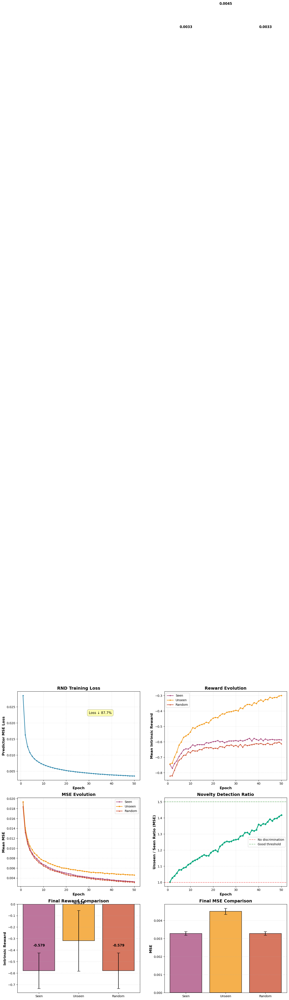

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T256_64_P512_256_64_norm_noconcat_20251118_062246.json'

Experiment complete.

✅ Experiment 'granite_deep_pred_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:22:51
⏱️  Duration: 3m 6s (186.2s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 19 experiments)

Running Experiment 19/30: granite_deep_both_t64-p64
🕐 Started at: 2025-11-18 06:22:52


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (512, 256, 64)
  predictor_layers: (1024, 512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...

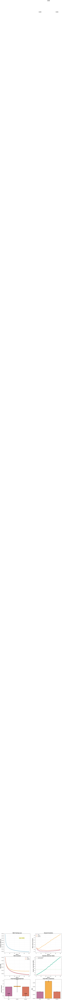

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T512_256_64_P1024_512_64_norm_noconcat_20251118_062609.json'

Experiment complete.

✅ Experiment 'granite_deep_both_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:26:21
⏱️  Duration: 3m 29s (209.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 20 experiments)

Running Experiment 20/30: granite_narrow_t8-p8
🕐 Started at: 2025-11-18 06:26:21


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite (ibm-granite/granite-embedding-english-r2)
  target_layers: (128, 8)
  predictor_layers: (256, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModule...
  Embedding

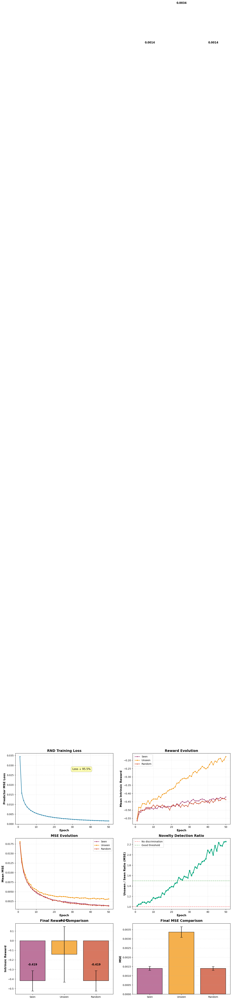

✓ Results saved to 'results/results_precomp_granite_train12000_ep50_lr0.0001_bs50_T128_8_P256_8_norm_noconcat_20251118_062847.json'

Experiment complete.

✅ Experiment 'granite_narrow_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 06:28:53
⏱️  Duration: 2m 32s (152.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 21 experiments)

Running Experiment 21/30: granite-small_eq_medium_t64-p64
🕐 Started at: 2025-11-18 06:28:53


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (256, 64)
  predictor_layers: (256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12000

Initializing RNDModule.

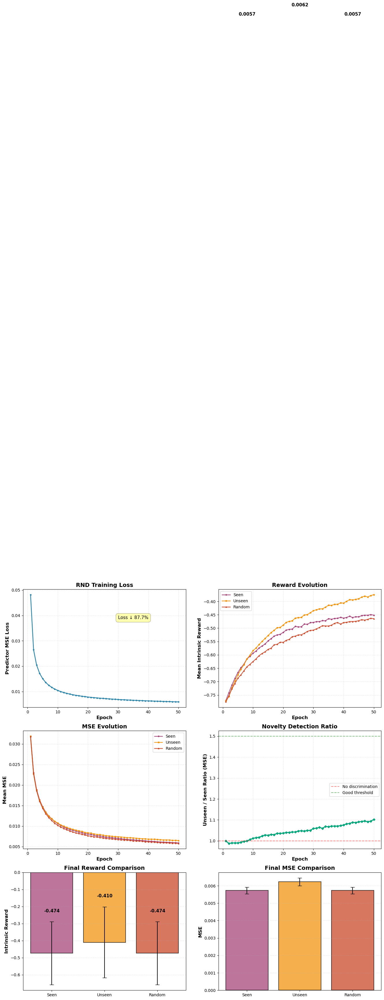

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P256_64_norm_noconcat_20251118_063119.json'

Experiment complete.

✅ Experiment 'granite-small_eq_medium_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:31:24
⏱️  Duration: 2m 30s (150.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 22 experiments)

Running Experiment 22/30: granite-small_eq_small_t8-p8
🕐 Started at: 2025-11-18 06:31:24


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (128, 8)
  predictor_layers: (128, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12000

Initializ

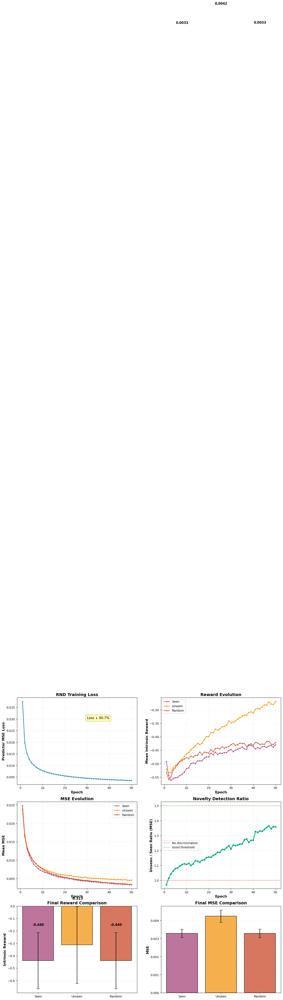

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_8_P128_8_norm_noconcat_20251118_063337.json'

Experiment complete.

✅ Experiment 'granite-small_eq_small_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 06:33:42
⏱️  Duration: 2m 18s (138.3s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 23 experiments)

Running Experiment 23/30: granite-small_eq_wide_t64-p64
🕐 Started at: 2025-11-18 06:33:42


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (512, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12000

Initializin

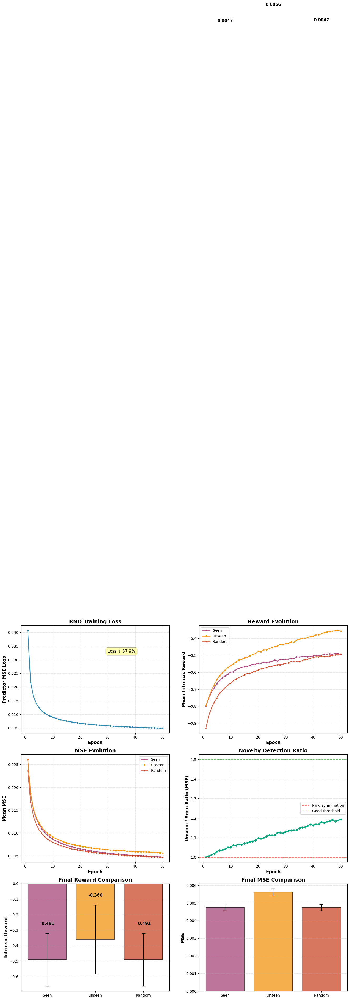

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T512_64_P512_64_norm_noconcat_20251118_063556.json'

Experiment complete.

✅ Experiment 'granite-small_eq_wide_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:36:00
⏱️  Duration: 2m 18s (138.2s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 24 experiments)

Running Experiment 24/30: granite-small_eq_deep_t64-p64
🕐 Started at: 2025-11-18 06:36:01


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (512, 256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12000

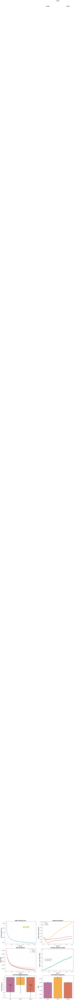

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T512_256_64_P512_256_64_norm_noconcat_20251118_063851.json'

Experiment complete.

✅ Experiment 'granite-small_eq_deep_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:39:01
⏱️  Duration: 3m 0s (180.7s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 25 experiments)

Running Experiment 25/30: granite-small_predlarge_mod_t64-p64
🕐 Started at: 2025-11-18 06:39:01


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (128, 64)
  predictor_layers: (512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12

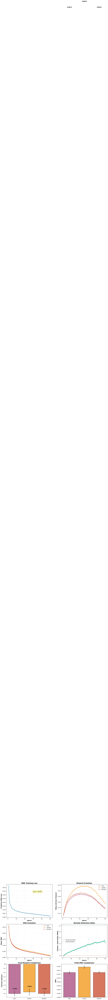

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_64_P512_64_norm_noconcat_20251118_064128.json'

Experiment complete.

✅ Experiment 'granite-small_predlarge_mod_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:41:36
⏱️  Duration: 2m 34s (154.6s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 26 experiments)

Running Experiment 26/30: granite-small_predlarge_big_t64-p64
🕐 Started at: 2025-11-18 06:41:36


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (256, 64)
  predictor_layers: (1024, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12

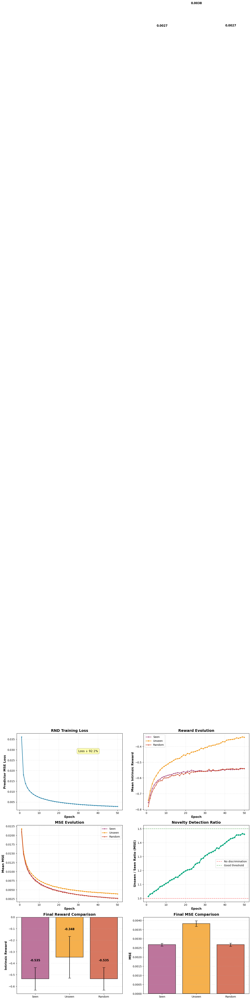

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P1024_64_norm_noconcat_20251118_064417.json'

Experiment complete.

✅ Experiment 'granite-small_predlarge_big_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:44:22
⏱️  Duration: 2m 46s (166.1s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 27 experiments)

Running Experiment 27/30: granite-small_extreme_ultra_t64-p64
🕐 Started at: 2025-11-18 06:44:22


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (128, 64)
  predictor_layers: (2048, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 1

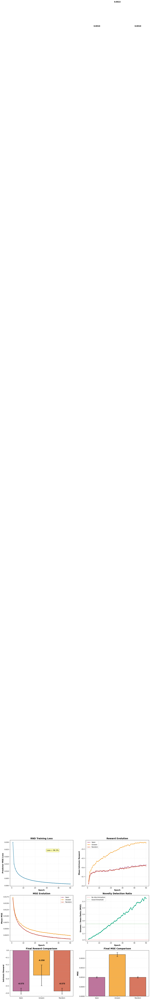

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_64_P2048_64_norm_noconcat_20251118_064658.json'

Experiment complete.

✅ Experiment 'granite-small_extreme_ultra_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:47:05
⏱️  Duration: 2m 42s (162.8s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 28 experiments)

Running Experiment 28/30: granite-small_deep_pred_t64-p64
🕐 Started at: 2025-11-18 06:47:05


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (256, 64)
  predictor_layers: (512, 256, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 1

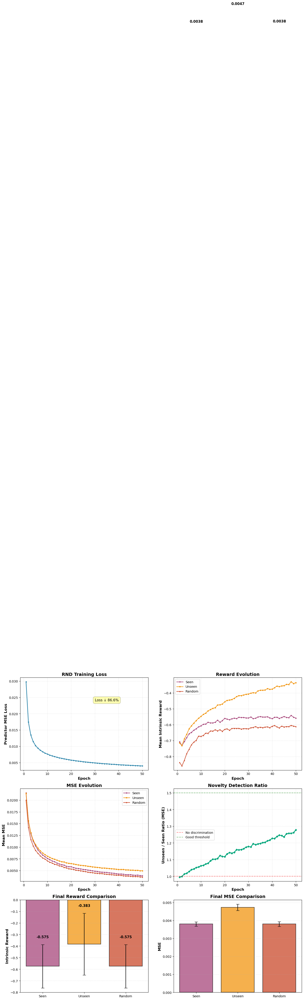

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P512_256_64_norm_noconcat_20251118_064954.json'

Experiment complete.

✅ Experiment 'granite-small_deep_pred_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:49:59
⏱️  Duration: 2m 53s (174.0s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 29 experiments)

Running Experiment 29/30: granite-small_deep_both_t64-p64
🕐 Started at: 2025-11-18 06:49:59


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (512, 256, 64)
  predictor_layers: (1024, 512, 64)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num sampl

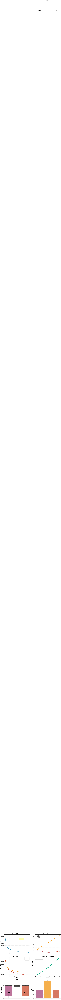

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T512_256_64_P1024_512_64_norm_noconcat_20251118_065306.json'

Experiment complete.

✅ Experiment 'granite-small_deep_both_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 06:53:17
⏱️  Duration: 3m 18s (198.2s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 30 experiments)

Running Experiment 30/30: granite-small_narrow_t8-p8
🕐 Started at: 2025-11-18 06:53:18


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: granite-small (ibm-granite/granite-embedding-small-english-r2)
  target_layers: (128, 8)
  predictor_layers: (256, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_granite-small_12000.pkl...
✓ Loaded 70.31 MB
✓ Embedding dim: 384
✓ Num samples: 12000

In

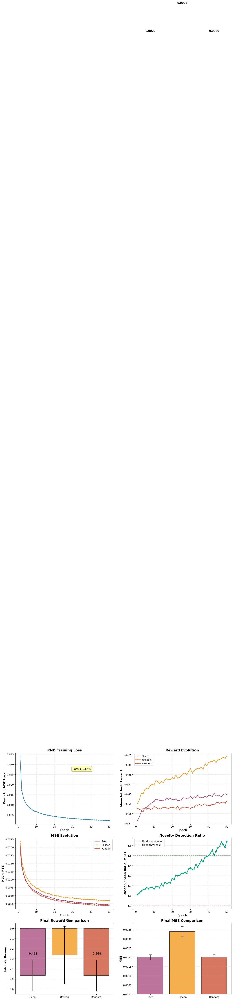

✓ Results saved to 'results/results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_8_P256_8_norm_noconcat_20251118_065543.json'

Experiment complete.

✅ Experiment 'granite-small_narrow_t8-p8' completed successfully!
🕐 Ended at: 2025-11-18 06:55:49
⏱️  Duration: 2m 30s (150.9s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 31 experiments)

🎉 All experiments completed!
📊 Total experiments run: 31
💾 Final summary saved to: results/precomp_all_experiments_summary.json


In [ ]:
import time
import pandas as pd

# Define hyperparameter configurations to test
arch_configs = [
    # 1. Equal medium
    ((256, 64),   (256, 64),   "eq_medium_t64-p64"),

    # 2. Equal small
    ((128, 8),   (128, 8),   "eq_small_t8-p8"),

    # 3. Equal wide
    ((512, 64),   (512, 64),   "eq_wide_t64-p64"),

    # 4. Equal Deep
    ((512, 256, 64), (512, 256, 64), "eq_deep_t64-p64"),

    # 5. Predictor larger moderate
    ((128, 64),   (512, 64),   "predlarge_mod_t64-p64"),

    # 6. Predictor larger big
    ((256, 64),   (1024, 64),  "predlarge_big_t64-p64"),

    # 7. Extreme ultra-wide predictor
    ((128, 64),   (2048, 64),  "extreme_ultra_t64-p64"),

    # 8. Deep predictor only
    ((256, 64),   (512, 256, 64), "deep_pred_t64-p64"),

    # 9. Deep both
    ((512, 256, 64), (1024, 512, 64), "deep_both_t64-p64"),

    # 10. Narrow bottleneck layer
    ((128, 8),    (256, 8),    "narrow_t8-p8")
]

encoders = ["gte", "granite", "granite-small"]

experiment_configs = []

for enc in encoders:
    for (t_layers, p_layers, tag) in arch_configs:
        experiment_configs.append({
            'name': f'{enc}_{tag}',
            'encoder_name': enc,
            'num_train_samples': 12000,
            'num_epochs': 50,
            'learning_rate': 1e-4,
            'batch_size': 50,
            'target_layers': t_layers,
            'predictor_layers': p_layers,
            'normalize_embeddings': True,
            'concat_problem_answer': False,
        })

# Run all experiments
all_results = []
summary_path = 'results/precomp_all_experiments_summary.json'

# Load existing results if resuming
if Path(summary_path).exists():
    print(f"\n📂 Found existing summary file: {summary_path}")
    with open(summary_path, 'r') as f:
        all_results = json.load(f)
    print(f"✓ Loaded {len(all_results)} previous experiment(s)")
    
    # Extract completed experiment names
    completed_names = {result.get('experiment_name', '') for result in all_results}
    print(f"✓ Completed experiments: {completed_names}")
else:
    print(f"\n📂 Starting fresh - no previous results found")
    completed_names = set()

for i, config in enumerate(experiment_configs):
    exp_name = config.get('name', f'precomp_experiment_{i+1}')
    
    # Skip if already completed
    if exp_name in completed_names:
        print(f"\n⏭️  Skipping '{exp_name}' (already completed)")
        continue
    
    print(f"\n{'='*70}")
    print(f"Running Experiment {i+1}/{len(experiment_configs)}: {exp_name}")
    print(f"{'='*70}")
    
    # Record start time
    start_time = time.time()
    start_datetime = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    print(f"🕐 Started at: {start_datetime}\n")
    
    # Extract name and remove from config
    config_copy = config.copy()
    config_copy.pop('name')
    
    try:
        # Run experiment with pre-computed embeddings
        results = run_rnd_experiment_precomputed(**config_copy, save_dir='results')
        
        # Record end time
        end_time = time.time()
        end_datetime = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        duration_seconds = end_time - start_time
        duration_minutes = duration_seconds / 60
        
        # Add timing and experiment name to results
        results['experiment_name'] = exp_name
        results['timing'] = {
            'start_time': start_datetime,
            'end_time': end_datetime,
            'duration_seconds': duration_seconds,
            'duration_minutes': duration_minutes,
            'duration_formatted': f"{int(duration_minutes)}m {int(duration_seconds % 60)}s"
        }
        
        all_results.append(results)
        
        # Save incremental summary after each experiment
        with open(summary_path, 'w') as f:
            json.dump(all_results, f, indent=2)
        
        print(f"\n✅ Experiment '{exp_name}' completed successfully!")
        print(f"🕐 Ended at: {end_datetime}")
        print(f"⏱️  Duration: {int(duration_minutes)}m {int(duration_seconds % 60)}s ({duration_seconds:.1f}s)")
        print(f"💾 Summary updated: {summary_path} (now contains {len(all_results)} experiments)")
        
    except Exception as e:
        print(f"\n❌ Experiment '{exp_name}' failed with error: {e}")
        import traceback
        traceback.print_exc()

print(f"\n{'='*70}")
print(f"🎉 All experiments completed!")
print(f"📊 Total experiments run: {len(all_results)}")
print(f"💾 Final summary saved to: {summary_path}")
print(f"{'='*70}")


📂 Found existing summary file: results/precomp_all_experiments_summary.json
✓ Loaded 31 previous experiment(s)
✓ Completed experiments: {'granite-small_deep_both_t64-p64', 'granite_deep_pred_t64-p64', 'granite-small_deep_pred_t64-p64', 'gte_eq_deep_t64-p64', 'granite_predlarge_big_t64-p64', 'granite_extreme_ultra_t64-p64', 'gte_narrow_t8-p8', 'granite_deep_both_t64-p64', 'gte_eq_medium_t64-p64', 'granite_narrow_t8-p8', 'granite_eq_deep_t64-p64', 'gte_deep_both_t64-p64', 'gte_extreme_ultra_t64-p64', 'gte_predlarge_mod_t64-p64', 'gte_predlarge_big_t64-p64', 'granite-small_eq_small_t8-p8', 'granite-small_eq_medium_t64-p64', 'granite-small_predlarge_mod_t64-p64', 'granite-small_extreme_ultra_t64-p64', 'granite_eq_wide_t64-p64', 'gte_deep_pred_t64-p64', 'gte_eq_small_t32-p32', 'granite_eq_medium_t64-p64', 'granite_eq_small_t8-p8', 'granite_predlarge_mod_t64-p64', 'gte_eq_small_t8-p8', 'granite-small_eq_wide_t64-p64', 'granite-small_eq_deep_t64-p64', 'gte_eq_wide_t64-p64', 'granite-small_pr

C:\Users\spand\AppData\Local\Temp\ipykernel_12392\1132188148.py:44: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
C:\Users\spand\AppData\Local\Temp\ipykernel_12392\1132188148.py:92: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 1/50 | Loss: 0.042963 | R_seen: -0.7991 | R_unseen: -0.7916 | R_random: -0.7833 | MSE_seen: 0.0271 | MSE_unseen: 0.0272 | MSE_random: 0.0274 | Ratio: 1.01x
Epoch 5/50 | Loss: 0.013828 | R_seen: -0.6731 | R_unseen: -0.6520 | R_random: -0.6979 | MSE_seen: 0.0130 | MSE_unseen: 0.0133 | MSE_random: 0.0126 | Ratio: 1.02x
Epoch 5/50 | Loss: 0.013828 | R_seen: -0.6731 | R_unseen: -0.6520 | R_random: -0.6979 | MSE_seen: 0.0130 | MSE_unseen: 0.0133 | MSE_random: 0.0126 | Ratio: 1.02x
Epoch 10/50 | Loss: 0.010077 | R_seen: -0.5928 | R_unseen: -0.5482 | R_random: -0.6320 | MSE_seen: 0.0099 | MSE_unseen: 0.0104 | MSE_random: 0.0094 | Ratio: 1.05x
Epoch 10/50 | Loss: 0.010077 | R_seen: -0.5928 | R_unseen: -0.5482 | R_random: -0.6320 | MSE_seen: 0.0099 | MSE_unseen: 0.0104 | MSE_random: 0.0094 | Ratio: 1.05x
Epoch 15/50 | Loss: 0.008633 | R_seen: -0.5539 | R_unseen: -0.4841 | R_random: -0.5896 | MSE_seen: 0.0085 | MSE_unseen: 0.0093 | MSE_random: 0.0081 | Ratio: 1.09x
Epoch 15/50 | Loss: 0.008

C:\Users\spand\AppData\Local\Temp\ipykernel_12392\3437759756.py:132: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


✓ Plot saved as 'results/plot_precomp_gte_train12000_ep50_lr0.0001_bs50_T256_64_P256_64_norm_noconcat_20251118_124017.png'


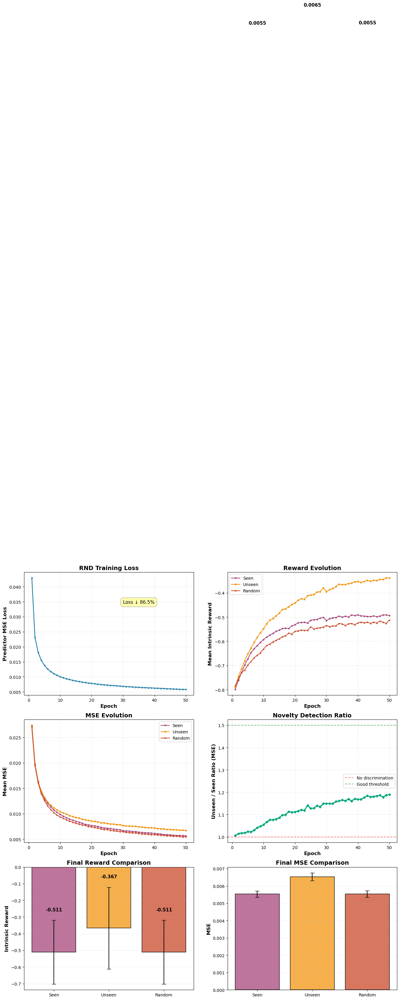

✓ Results saved to 'results/results_precomp_gte_train12000_ep50_lr0.0001_bs50_T256_64_P256_64_norm_noconcat_20251118_124017.json'

Experiment complete.

✅ Experiment 'gte_eq_medium_t64-p64' completed successfully!
🕐 Ended at: 2025-11-18 12:40:21
⏱️  Duration: 2m 1s (121.8s)
💾 Summary updated: results/precomp_all_experiments_summary.json (now contains 32 experiments)

⏭️  Skipping 'gte_eq_small_t8-p8' (already completed)

Running Experiment 2/33: gte_eq_small_t8-p8
🕐 Started at: 2025-11-18 12:40:22


STARTING RND EXPERIMENT (PRE-COMPUTED EMBEDDINGS)

📋 Hyperparameters:
  num_train_samples: 12000
  encoder_name: gte (Alibaba-NLP/gte-modernbert-base)
  target_layers: (128, 8)
  predictor_layers: (128, 8)
  normalize_embeddings: True
  concat_problem_answer: False
  num_epochs: 50
  learning_rate: 0.0001
  batch_size: 50
  device: cuda
  seed: 42
Loading embeddings from embeddings/embeddings_gte_12000.pkl...
✓ Loaded 140.63 MB
✓ Embedding dim: 768
✓ Num samples: 12000

Initializing RNDModu

KeyboardInterrupt: 

In [ ]:

# Define hyperparameter configurations to test
arch_configs = [
    # 1. Equal medium
    ((256, 64),   (256, 64),   "eq_medium_t64-p64"),

]

encoders = ["gte"]

for enc in encoders:
    for (t_layers, p_layers, tag) in arch_configs:
        experiment_configs.append({
            'name': f'{enc}_{tag}',
            'encoder_name': enc,
            'num_train_samples': 12000,
            'num_epochs': 50,
            'learning_rate': 1e-4,
            'batch_size': 50,
            'target_layers': t_layers,
            'predictor_layers': p_layers,
            'normalize_embeddings': True,
            'concat_problem_answer': False,
        })

# Load existing results if resuming
if Path(summary_path).exists():
    print(f"\n📂 Found existing summary file: {summary_path}")
    with open(summary_path, 'r') as f:
        all_results = json.load(f)
    print(f"✓ Loaded {len(all_results)} previous experiment(s)")
    
    # Extract completed experiment names
    completed_names = {result.get('experiment_name', '') for result in all_results}
    print(f"✓ Completed experiments: {completed_names}")
else:
    print(f"\n📂 Starting fresh - no previous results found")
    completed_names = set()

for i, config in enumerate(experiment_configs):
    exp_name = config.get('name', f'precomp_experiment_{i+1}')
    
    # Skip if already completed
    if exp_name in completed_names:
        print(f"\n⏭️  Skipping '{exp_name}' (already completed)")
        # continue
    
    print(f"\n{'='*70}")
    print(f"Running Experiment {i+1}/{len(experiment_configs)}: {exp_name}")
    print(f"{'='*70}")
    
    # Record start time
    start_time = time.time()
    start_datetime = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    print(f"🕐 Started at: {start_datetime}\n")
    
    # Extract name and remove from config
    config_copy = config.copy()
    config_copy.pop('name')
    
    try:
        # Run experiment with pre-computed embeddings
        results = run_rnd_experiment_precomputed(**config_copy, save_dir='results')
        
        # Record end time
        end_time = time.time()
        end_datetime = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        duration_seconds = end_time - start_time
        duration_minutes = duration_seconds / 60
        
        # Add timing and experiment name to results
        results['experiment_name'] = exp_name
        results['timing'] = {
            'start_time': start_datetime,
            'end_time': end_datetime,
            'duration_seconds': duration_seconds,
            'duration_minutes': duration_minutes,
            'duration_formatted': f"{int(duration_minutes)}m {int(duration_seconds % 60)}s"
        }
        
        all_results.append(results)
        
        # Save incremental summary after each experiment
        with open(summary_path, 'w') as f:
            json.dump(all_results, f, indent=2)
        
        print(f"\n✅ Experiment '{exp_name}' completed successfully!")
        print(f"🕐 Ended at: {end_datetime}")
        print(f"⏱️  Duration: {int(duration_minutes)}m {int(duration_seconds % 60)}s ({duration_seconds:.1f}s)")
        print(f"💾 Summary updated: {summary_path} (now contains {len(all_results)} experiments)")
        
    except Exception as e:
        print(f"\n❌ Experiment '{exp_name}' failed with error: {e}")
        import traceback
        traceback.print_exc()

print(f"\n{'='*70}")
print(f"🎉 All experiments completed!")
print(f"📊 Total experiments run: {len(all_results)}")
print(f"💾 Final summary saved to: {summary_path}")
print(f"{'='*70}")

In [ ]:
pd.DataFrame(experiment_configs)

,name,encoder_name,num_train_samples,num_epochs,learning_rate,batch_size,target_layers,predictor_layers,normalize_embeddings,concat_problem_answer
0,gte_eq_medium_t64-p64,gte,12000,50,0.0001,50,"(256, 64)","(256, 64)",True,False
1,gte_eq_small_t8-p8,gte,12000,50,0.0001,50,"(128, 8)","(128, 8)",True,False
2,gte_eq_wide_t64-p64,gte,12000,50,0.0001,50,"(512, 64)","(512, 64)",True,False
3,gte_eq_deep_t64-p64,gte,12000,50,0.0001,50,"(512, 256, 64)","(512, 256, 64)",True,False
4,gte_predlarge_mod_t64-p64,gte,12000,50,0.0001,50,"(128, 64)","(512, 64)",True,False
5,gte_predlarge_big_t64-p64,gte,12000,50,0.0001,50,"(256, 64)","(1024, 64)",True,False
6,gte_extreme_ultra_t64-p64,gte,12000,50,0.0001,50,"(128, 64)","(2048, 64)",True,False
7,gte_deep_pred_t64-p64,gte,12000,50,0.0001,50,"(256, 64)","(512, 256, 64)",True,False
8,gte_deep_both_t64-p64,gte,12000,50,0.0001,50,"(512, 256, 64)","(1024, 512, 64)",True,False
9,gte_narrow_t8-p8,gte,12000,50,0.0001,50,"(128, 8)","(256, 8)",True,False


# Compare Results Across Experiments

Analyze and compare the results from all pre-computed embedding experiments:

In [ ]:
import glob
from pathlib import Path
import json

# ==================== REBUILD SUMMARY FROM INDIVIDUAL FILES ====================

print("\n" + "="*70)
print("REBUILDING SUMMARY FROM INDIVIDUAL JSON FILES")
print("="*70)

# Find all individual result files
results_pattern = 'results/results_precomp_*.json'
individual_files = glob.glob(results_pattern)

# Exclude the summary file itself
individual_files = [f for f in individual_files if 'all_experiments_summary' not in f]

print(f"\n📂 Found {len(individual_files)} individual result files:")
for filepath in sorted(individual_files):
    print(f"  • {Path(filepath).name}")

# Load all individual results
all_results = []
loaded_count = 0
failed_count = 0

print("\n🔄 Loading individual files...")
for filepath in sorted(individual_files):
    try:
        with open(filepath, 'r') as f:
            result = json.load(f)
        
        # Extract experiment name from result or filename
        if 'experiment_name' not in result:
            # Try to extract from filename
            filename = Path(filepath).stem
            # Remove 'results_' prefix and timestamp suffix
            parts = filename.replace('results_', '').split('_')
            # Reconstruct experiment name (encoder + architecture tag)
            if len(parts) >= 2:
                result['experiment_name'] = f"{parts[1]}_{parts[-2]}" if len(parts) > 2 else filename
        
        all_results.append(result)
        loaded_count += 1
        
        # Show loaded experiment info
        exp_name = result.get('experiment_name', 'unknown')
        encoder = result.get('hyperparameters', {}).get('encoder_name', 'unknown')
        ratio = result.get('test_results', {}).get('ratios', {}).get('unseen_vs_seen', 0)
        print(f"  ✓ Loaded: {exp_name} (encoder={encoder}, ratio={ratio:.3f})")
        
    except Exception as e:
        failed_count += 1
        print(f"  ✗ Failed to load {Path(filepath).name}: {e}")

print(f"\n📊 Summary:")
print(f"  Successfully loaded: {loaded_count}")
print(f"  Failed to load: {failed_count}")
print(f"  Total experiments: {len(all_results)}")

# Save rebuilt summary
summary_path = 'results/precomp_all_experiments_summary.json'
with open(summary_path, 'w') as f:
    json.dump(all_results, f, indent=2)

# Calculate file size
file_size_mb = Path(summary_path).stat().st_size / (1024 * 1024)
print(f"\n💾 Rebuilt summary saved to: {summary_path}")
print(f"   File size: {file_size_mb:.2f} MB")

# Display experiment names
print(f"\n📋 Experiments in rebuilt summary:")
for i, result in enumerate(all_results, 1):
    exp_name = result.get('experiment_name', f'experiment_{i}')
    encoder = result.get('hyperparameters', {}).get('encoder_name', '?')
    ratio = result.get('test_results', {}).get('ratios', {}).get('unseen_vs_seen', 0)
    print(f"  {i:2d}. {exp_name:40s} | {encoder:15s} | Ratio: {ratio:.3f}")

print("\n" + "="*70)
print("✅ Summary rebuild complete! You can now run the analysis cell.")
print("="*70)


REBUILDING SUMMARY FROM INDIVIDUAL JSON FILES

📂 Found 30 individual result files:
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_64_P2048_64_norm_noconcat_20251118_064658.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_64_P512_64_norm_noconcat_20251118_064128.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_8_P128_8_norm_noconcat_20251118_063337.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T128_8_P256_8_norm_noconcat_20251118_065543.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P1024_64_norm_noconcat_20251118_064417.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P256_64_norm_noconcat_20251118_063119.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T256_64_P512_256_64_norm_noconcat_20251118_064954.json
  • results_precomp_granite-small_train12000_ep50_lr0.0001_bs50_T512_256_64_P1024_512_64_norm_noconcat_202511

In [25]:
all_results[2]['experiment_name']

'granite-small_20251118'

In [21]:
summary_path = 'results/precomp_all_experiments_summary.json'

if not Path(summary_path).exists():
    print(f"❌ Results file not found: {summary_path}")
    print("Please run the batch experiments first!")
else:
    print(f"📂 Loading results from: {summary_path}")
    with open(summary_path, 'r') as f:
        all_results = json.load(f)
    print(f"✓ Loaded {len(all_results)} experiments\n")
def show_dict_structure(obj, name="root", indent=0, max_depth=10):
    """Recursively print keys and types for dicts/lists (stops at max_depth)."""
    if indent > max_depth:
        print("  " * indent + "... (max depth reached)")
        return

    prefix = "  " * indent
    if isinstance(obj, dict):
        print(f"{prefix}{name} (dict) keys:")
        for k, v in obj.items():
            tname = type(v).__name__
            print(f"{prefix}  - {k} : {tname}")
            # Recurse into nested dicts
            if isinstance(v, dict):
                show_dict_structure(v, name=f"{k}", indent=indent + 2, max_depth=max_depth)
            # If it's a list and first element is a dict, show its structure
            elif isinstance(v, list) and len(v) > 0 and isinstance(v[0], dict):
                print(f"{prefix}    -> list[{len(v)}] of dict; showing keys of first element:")
                show_dict_structure(v[0], name=f"{k}[0]", indent=indent + 3, max_depth=max_depth)
    elif isinstance(obj, list):
        print(f"{prefix}{name} (list) length={len(obj)} element_type={type(obj[0]).__name__ if obj else 'empty'}")
        if len(obj) > 0 and isinstance(obj[0], dict):
            show_dict_structure(obj[0], name=f"{name}[0]", indent=indent + 1, max_depth=max_depth)
    else:
        print(f"{prefix}{name} : {type(obj).__name__} (value repr truncated)")

# Choose which dictionary to inspect (change index as needed)
idx = 0
if not all_results:
    print("all_results is empty")
else:
    if idx >= len(all_results):
        print(f"Index {idx} out of range (len={len(all_results)})")
    else:
        print(f"Top-level keys for all_results[{idx}]: {list(all_results[idx].keys())}\n")
        show_dict_structure(all_results[idx], name=f"all_results[{idx}]")

📂 Loading results from: results/precomp_all_experiments_summary.json
✓ Loaded 30 experiments

Top-level keys for all_results[0]: ['hyperparameters', 'encoder_full_name', 'timestamp', 'training_logs', 'training_metrics', 'test_results', 'interpretation', 'experiment_name']

all_results[0] (dict) keys:
  - hyperparameters : dict
    hyperparameters (dict) keys:
      - num_train_samples : int
      - encoder_name : str
      - target_layers : list
      - predictor_layers : list
      - normalize_embeddings : bool
      - concat_problem_answer : bool
      - num_epochs : int
      - learning_rate : float
      - batch_size : int
      - device : str
      - seed : int
  - encoder_full_name : str
  - timestamp : str
  - training_logs : dict
    training_logs (dict) keys:
      - training_losses : list
      - epoch_rewards_s1 : list
      - epoch_rewards_s3 : list
      - epoch_rewards_rand : list
      - epoch_mse_s1 : list
      - epoch_mse_s3 : list
      - epoch_mse_rand : list
      

📂 Loading results from: results/precomp_all_experiments_summary.json
✓ Loaded 30 experiments


EXPERIMENT COMPARISON - SCALE-INVARIANT METRICS

Key Discrimination Metrics (higher = better):
            Experiment       Encoder  Ratio U/S  Log Ratio U/S  Cohen d U/S  Separation % Novelty Detection
granite-small_20251118 granite-small   2.207536       0.791877    15.495421    120.754626            strong
granite-small_20251118 granite-small   1.222541       0.200932     4.617462     22.254896          moderate
granite-small_20251118 granite-small   1.289371       0.254154     3.335842     28.937379          moderate
granite-small_20251118 granite-small   1.693638       0.526879     6.349534     69.364297            strong
granite-small_20251118 granite-small   1.430354       0.357922     9.422928     43.035821          moderate
granite-small_20251118 granite-small   1.087337       0.083731     2.383152      8.733828              weak
granite-small_20251118 granite-small   1.243357       

C:\Users\spand\AppData\Local\Temp\ipykernel_19040\2686280291.py:294: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax11.boxplot(encoder_groups, labels=encoders_unique, patch_artist=True, showmeans=True)



✓ Comprehensive analysis plot saved to: results/precomp_comprehensive_analysis.png


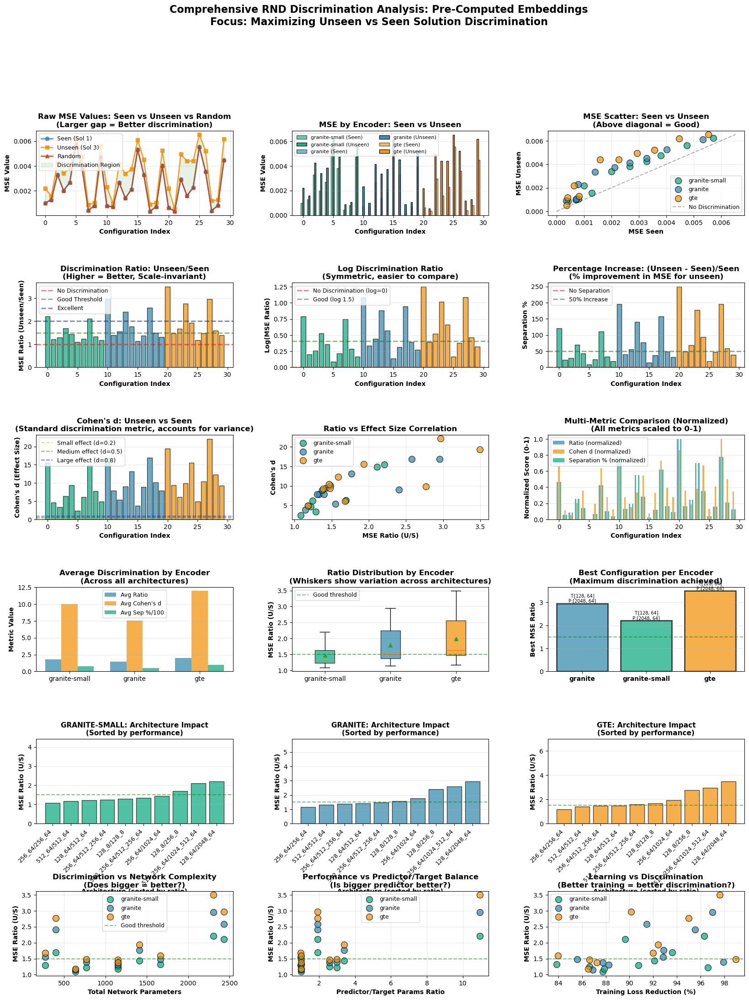


STATISTICAL INSIGHTS

📊 Overall Statistics:
  Mean MSE Ratio (U/S): 1.757 ± 0.640
  Mean Cohen's d: 9.810 ± 5.026
  Mean Separation %: 75.7% ± 64.0%
  Configs with 'strong' novelty detection: 14/30

📊 By Encoder:

  GRANITE-SMALL:
    Mean Ratio: 1.480 (range: 1.087 - 2.208)
    Mean Cohen's d: 7.532
    Best architecture: granite-small_20251118
      → Ratio: 2.208
      → Target: [128, 64]
      → Predictor: [2048, 64]

  GRANITE:
    Mean Ratio: 1.797 (range: 1.144 - 2.955)
    Mean Cohen's d: 9.974
    Best architecture: granite_20251118
      → Ratio: 2.955
      → Target: [128, 64]
      → Predictor: [2048, 64]

  GTE:
    Mean Ratio: 1.993 (range: 1.180 - 3.493)
    Mean Cohen's d: 11.924
    Best architecture: gte_20251118
      → Ratio: 3.493
      → Target: [128, 64]
      → Predictor: [2048, 64]

📊 Network Complexity Insights:
  Correlation (Total Params vs Ratio): 0.549
  Correlation (Predictor/Target Ratio vs Ratio): 0.610

💡 Key Insights:
  • Larger networks tend to disc

In [17]:
import numpy as np
import pandas as pd
from pathlib import Path
import json
import matplotlib.pyplot as plt
# Load results from saved file
summary_path = 'results/precomp_all_experiments_summary.json'

if not Path(summary_path).exists():
    print(f"❌ Results file not found: {summary_path}")
    print("Please run the batch experiments first!")
else:
    print(f"📂 Loading results from: {summary_path}")
    with open(summary_path, 'r') as f:
        all_results = json.load(f)
    print(f"✓ Loaded {len(all_results)} experiments\n")

# Extract data for analysis
comparison_data = []

for result in all_results:
    # Extract basic metrics
    encoder = result['hyperparameters']['encoder_name']
    target_layers = result['hyperparameters']['target_layers']
    predictor_layers = result['hyperparameters']['predictor_layers']
    
    # Get test results
    mse_seen = result['test_results']['mse']['seen_mean']
    mse_unseen = result['test_results']['mse']['unseen_mean']
    mse_random = result['test_results']['mse']['random_mean']
    std_seen = result['test_results']['mse']['seen_std']
    std_unseen = result['test_results']['mse']['unseen_std']
    std_random = result['test_results']['mse']['random_std']
    
    reward_seen = result['test_results']['rewards']['seen_mean']
    reward_unseen = result['test_results']['rewards']['unseen_mean']
    reward_random = result['test_results']['rewards']['random_mean']
    
    # Calculate scale-invariant metrics
    # 1. MSE Ratios (higher = better discrimination)
    ratio_unseen_seen = mse_unseen / (mse_seen + 1e-8)
    ratio_random_seen = mse_random / (mse_seen + 1e-8)
    ratio_unseen_random = mse_unseen / (mse_random + 1e-8)
    
    # 2. Log Ratios (symmetric, better for visualization)
    log_ratio_unseen_seen = np.log(ratio_unseen_seen)
    log_ratio_random_seen = np.log(ratio_random_seen)
    
    # 3. Cohen's d (effect size) - standard discrimination metric
    # d = (mean1 - mean2) / pooled_std
    pooled_std_unseen_seen = np.sqrt((std_unseen**2 + std_seen**2) / 2)
    cohens_d_unseen_seen = (mse_unseen - mse_seen) / (pooled_std_unseen_seen + 1e-8)
    
    pooled_std_random_seen = np.sqrt((std_random**2 + std_seen**2) / 2)
    cohens_d_random_seen = (mse_random - mse_seen) / (pooled_std_random_seen + 1e-8)
    
    # 4. Separation score: (unseen - seen) / seen (percentage increase)
    separation_pct = ((mse_unseen - mse_seen) / (mse_seen + 1e-8)) * 100
    
    # Network complexity metrics
    target_params = sum(target_layers)
    predictor_params = sum(predictor_layers)
    total_params = target_params + predictor_params
    
    comparison_data.append({
        'Experiment': result.get('experiment_name', 'unknown'),
        'Encoder': encoder,
        'Target Layers': str(target_layers),
        'Predictor Layers': str(predictor_layers),
        'Target Params': target_params,
        'Predictor Params': predictor_params,
        'Total Params': total_params,
        
        # Raw MSE values
        'MSE Seen': mse_seen,
        'MSE Unseen': mse_unseen,
        'MSE Random': mse_random,
        'Std Seen': std_seen,
        'Std Unseen': std_unseen,
        'Std Random': std_random,
        
        # Raw Reward values
        'Reward Seen': reward_seen,
        'Reward Unseen': reward_unseen,
        'Reward Random': reward_random,
        
        # Scale-invariant discrimination metrics
        'Ratio U/S': ratio_unseen_seen,
        'Ratio R/S': ratio_random_seen,
        'Ratio U/R': ratio_unseen_random,
        'Log Ratio U/S': log_ratio_unseen_seen,
        'Log Ratio R/S': log_ratio_random_seen,
        'Cohen d U/S': cohens_d_unseen_seen,
        'Cohen d R/S': cohens_d_random_seen,
        'Separation %': separation_pct,
        
        # Training metrics
        'Final Loss': result['training_metrics']['final_loss'],
        'Loss Reduction %': result['training_metrics']['loss_reduction_pct'],
        'Final Ratio': result['training_metrics']['final_ratio'],
        
        # Other
        'Novelty Detection': result['interpretation']['novelty_detection'],
        'Duration (min)': result.get('timing', {}).get('duration_minutes', 0),
    })

df = pd.DataFrame(comparison_data)

# Display summary statistics
print("\n" + "="*120)
print("EXPERIMENT COMPARISON - SCALE-INVARIANT METRICS")
print("="*120)
print("\nKey Discrimination Metrics (higher = better):")
print(df[['Experiment', 'Encoder', 'Ratio U/S', 'Log Ratio U/S', 'Cohen d U/S', 'Separation %', 'Novelty Detection']].to_string(index=False))
print("="*120)

# Find best configurations by different metrics
print("\n🏆 TOP 5 CONFIGURATIONS BY DIFFERENT METRICS:")
print("\n1. By MSE Ratio (Unseen/Seen):")
top5_ratio = df.nlargest(5, 'Ratio U/S')[['Experiment', 'Encoder', 'Ratio U/S', 'MSE Seen', 'MSE Unseen']]
print(top5_ratio.to_string(index=False))

print("\n2. By Cohen's d (Effect Size):")
top5_cohens = df.nlargest(5, 'Cohen d U/S')[['Experiment', 'Encoder', 'Cohen d U/S', 'Ratio U/S', 'Separation %']]
print(top5_cohens.to_string(index=False))

print("\n3. By Separation Percentage:")
top5_sep = df.nlargest(5, 'Separation %')[['Experiment', 'Encoder', 'Separation %', 'Ratio U/S', 'MSE Seen', 'MSE Unseen']]
print(top5_sep.to_string(index=False))

# Save detailed comparison
csv_path = 'results/precomp_detailed_comparison.csv'
df.to_csv(csv_path, index=False)
print(f"\n✓ Detailed comparison saved to: {csv_path}")

print("\n" + "="*120)

# ==================== VISUALIZATIONS ====================

fig = plt.figure(figsize=(20, 24))
gs = fig.add_gridspec(6, 3, hspace=0.8, wspace=0.3,)

# Color mapping
encoder_colors = {'granite': '#2E86AB', 'granite-small': '#06A77D', 'gte': '#F18F01'}
colors = [encoder_colors[enc] for enc in df['Encoder']]

# ==================== ROW 1: RAW MSE VALUES ====================

# Plot 1.1: MSE Values - Connected Lines (Seen vs Unseen vs Random)
ax1 = fig.add_subplot(gs[0, 0])
x_pos = np.arange(len(df))
ax1.plot(x_pos, df['MSE Seen'], 'o-', color='#2E86AB', linewidth=2, markersize=6, label='Seen (Sol 1)', alpha=0.8)
ax1.plot(x_pos, df['MSE Unseen'], 's-', color='#F18F01', linewidth=2, markersize=6, label='Unseen (Sol 3)', alpha=0.8)
ax1.plot(x_pos, df['MSE Random'], '^-', color='#C73E1D', linewidth=2, markersize=6, label='Random', alpha=0.8)
ax1.fill_between(x_pos, df['MSE Seen'], df['MSE Unseen'], alpha=0.1, color='green', label='Discrimination Region')
ax1.set_xlabel('Configuration Index', fontweight='bold')
ax1.set_ylabel('MSE Value', fontweight='bold')
ax1.set_title('Raw MSE Values: Seen vs Unseen vs Random\n(Larger gap = Better discrimination)', fontweight='bold', fontsize=12)
ax1.legend(loc='best', fontsize=9)
ax1.grid(True, alpha=0.3)

# Plot 1.2: MSE Values by Encoder (Grouped)
ax2 = fig.add_subplot(gs[0, 1])
encoders_unique = df['Encoder'].unique()
x = np.arange(len(df))
width = 0.25
for i, enc in enumerate(encoders_unique):
    mask = df['Encoder'] == enc
    indices = np.where(mask)[0]
    ax2.bar(indices - width + i*width, df.loc[mask, 'MSE Seen'], width, 
            label=f'{enc} (Seen)', alpha=0.6, color=encoder_colors[enc], edgecolor='black')
    ax2.bar(indices, df.loc[mask, 'MSE Unseen'], width,
            label=f'{enc} (Unseen)', alpha=0.9, color=encoder_colors[enc], edgecolor='black')
ax2.set_xlabel('Configuration Index', fontweight='bold')
ax2.set_ylabel('MSE Value', fontweight='bold')
ax2.set_title('MSE by Encoder: Seen vs Unseen', fontweight='bold', fontsize=12)
ax2.legend(loc='best', fontsize=8, ncol=2)
ax2.grid(True, alpha=0.3, axis='y')

# Plot 1.3: Scatter: Seen vs Unseen MSE (colored by encoder)
ax3 = fig.add_subplot(gs[0, 2])
for enc in encoders_unique:
    mask = df['Encoder'] == enc
    ax3.scatter(df.loc[mask, 'MSE Seen'], df.loc[mask, 'MSE Unseen'], 
                c=encoder_colors[enc], label=enc, s=100, alpha=0.7, edgecolors='black')
# Add diagonal line (no discrimination)
max_val = max(df['MSE Seen'].max(), df['MSE Unseen'].max())
ax3.plot([0, max_val], [0, max_val], 'k--', alpha=0.3, label='No Discrimination')
ax3.set_xlabel('MSE Seen', fontweight='bold')
ax3.set_ylabel('MSE Unseen', fontweight='bold')
ax3.set_title('MSE Scatter: Seen vs Unseen\n(Above diagonal = Good)', fontweight='bold', fontsize=12)
ax3.legend(loc='best', fontsize=9)
ax3.grid(True, alpha=0.3)

# ==================== ROW 2: SCALE-INVARIANT RATIOS ====================

# Plot 2.1: MSE Ratio (Unseen/Seen) - Main discrimination metric
ax4 = fig.add_subplot(gs[1, 0])
bars = ax4.bar(x_pos, df['Ratio U/S'], color=colors, alpha=0.7, edgecolor='black')
ax4.axhline(y=1.0, color='red', linestyle='--', linewidth=2, alpha=0.5, label='No Discrimination')
ax4.axhline(y=1.5, color='green', linestyle='--', linewidth=2, alpha=0.5, label='Good Threshold')
ax4.axhline(y=2.0, color='blue', linestyle='--', linewidth=2, alpha=0.5, label='Excellent')
ax4.set_xlabel('Configuration Index', fontweight='bold')
ax4.set_ylabel('MSE Ratio (Unseen/Seen)', fontweight='bold')
ax4.set_title('Discrimination Ratio: Unseen/Seen\n(Higher = Better, Scale-invariant)', fontweight='bold', fontsize=12)
ax4.legend(loc='best', fontsize=9)
ax4.grid(True, alpha=0.3, axis='y')

# Plot 2.2: Log Ratio (symmetric scale)
ax5 = fig.add_subplot(gs[1, 1])
ax5.bar(x_pos, df['Log Ratio U/S'], color=colors, alpha=0.7, edgecolor='black')
ax5.axhline(y=0, color='red', linestyle='--', linewidth=2, alpha=0.5, label='No Discrimination (log=0)')
ax5.axhline(y=np.log(1.5), color='green', linestyle='--', linewidth=2, alpha=0.5, label='Good (log 1.5)')
ax5.set_xlabel('Configuration Index', fontweight='bold')
ax5.set_ylabel('Log(MSE Ratio)', fontweight='bold')
ax5.set_title('Log Discrimination Ratio\n(Symmetric, easier to compare)', fontweight='bold', fontsize=12)
ax5.legend(loc='best', fontsize=9)
ax5.grid(True, alpha=0.3, axis='y')

# Plot 2.3: Separation Percentage
ax6 = fig.add_subplot(gs[1, 2])
ax6.bar(x_pos, df['Separation %'], color=colors, alpha=0.7, edgecolor='black')
ax6.axhline(y=0, color='red', linestyle='--', linewidth=2, alpha=0.5, label='No Separation')
ax6.axhline(y=50, color='green', linestyle='--', linewidth=2, alpha=0.5, label='50% Increase')
ax6.set_xlabel('Configuration Index', fontweight='bold')
ax6.set_ylabel('Separation %', fontweight='bold')
ax6.set_title('Percentage Increase: (Unseen - Seen)/Seen\n(% improvement in MSE for unseen)', fontweight='bold', fontsize=12)
ax6.legend(loc='best', fontsize=9)
ax6.grid(True, alpha=0.3, axis='y')

# ==================== ROW 3: COHEN'S D (EFFECT SIZE) ====================

# Plot 3.1: Cohen's d - standard effect size metric
ax7 = fig.add_subplot(gs[2, 0])
ax7.bar(x_pos, df['Cohen d U/S'], color=colors, alpha=0.7, edgecolor='black')
ax7.axhline(y=0.2, color='orange', linestyle='--', alpha=0.5, label='Small effect (d=0.2)')
ax7.axhline(y=0.5, color='green', linestyle='--', alpha=0.5, label='Medium effect (d=0.5)')
ax7.axhline(y=0.8, color='blue', linestyle='--', alpha=0.5, label='Large effect (d=0.8)')
ax7.set_xlabel('Configuration Index', fontweight='bold')
ax7.set_ylabel("Cohen's d (Effect Size)", fontweight='bold')
ax7.set_title("Cohen's d: Unseen vs Seen\n(Standard discrimination metric, accounts for variance)", fontweight='bold', fontsize=12)
ax7.legend(loc='best', fontsize=9)
ax7.grid(True, alpha=0.3, axis='y')

# Plot 3.2: Cohen's d vs Ratio (correlation check)
ax8 = fig.add_subplot(gs[2, 1])
for enc in encoders_unique:
    mask = df['Encoder'] == enc
    ax8.scatter(df.loc[mask, 'Ratio U/S'], df.loc[mask, 'Cohen d U/S'],
                c=encoder_colors[enc], label=enc, s=100, alpha=0.7, edgecolors='black')
ax8.set_xlabel('MSE Ratio (U/S)', fontweight='bold')
ax8.set_ylabel("Cohen's d", fontweight='bold')
ax8.set_title("Ratio vs Effect Size Correlation", fontweight='bold', fontsize=12)
ax8.legend(loc='best', fontsize=9)
ax8.grid(True, alpha=0.3)

# Plot 3.3: Multi-metric comparison (normalized)
ax9 = fig.add_subplot(gs[2, 2])
# Normalize metrics to [0, 1] for comparison
ratio_norm = (df['Ratio U/S'] - df['Ratio U/S'].min()) / (df['Ratio U/S'].max() - df['Ratio U/S'].min())
cohens_norm = (df['Cohen d U/S'] - df['Cohen d U/S'].min()) / (df['Cohen d U/S'].max() - df['Cohen d U/S'].min())
sep_norm = (df['Separation %'] - df['Separation %'].min()) / (df['Separation %'].max() - df['Separation %'].min())

width = 0.25
ax9.bar(x_pos - width, ratio_norm, width, label='Ratio (normalized)', alpha=0.7, color='#2E86AB')
ax9.bar(x_pos, cohens_norm, width, label='Cohen d (normalized)', alpha=0.7, color='#F18F01')
ax9.bar(x_pos + width, sep_norm, width, label='Separation % (normalized)', alpha=0.7, color='#06A77D')
ax9.set_xlabel('Configuration Index', fontweight='bold')
ax9.set_ylabel('Normalized Score (0-1)', fontweight='bold')
ax9.set_title('Multi-Metric Comparison (Normalized)\n(All metrics scaled to 0-1)', fontweight='bold', fontsize=12)
ax9.legend(loc='best', fontsize=9)
ax9.grid(True, alpha=0.3, axis='y')

# ==================== ROW 4: ENCODER COMPARISON ====================

# Plot 4.1: Average metrics by encoder
ax10 = fig.add_subplot(gs[3, 0])
encoder_stats = df.groupby('Encoder')[['Ratio U/S', 'Cohen d U/S', 'Separation %']].mean()
x_enc = np.arange(len(encoders_unique))
width = 0.25
ax10.bar(x_enc - width, encoder_stats['Ratio U/S'], width, label='Avg Ratio', alpha=0.7, color='#2E86AB')
ax10.bar(x_enc, encoder_stats['Cohen d U/S'], width, label="Avg Cohen's d", alpha=0.7, color='#F18F01')
ax10.bar(x_enc + width, encoder_stats['Separation %']/100, width, label='Avg Sep %/100', alpha=0.7, color='#06A77D')
ax10.set_xticks(x_enc)
ax10.set_xticklabels(encoders_unique)
ax10.set_ylabel('Metric Value', fontweight='bold')
ax10.set_title('Average Discrimination by Encoder\n(Across all architectures)', fontweight='bold', fontsize=12)
ax10.legend(loc='best', fontsize=9)
ax10.grid(True, alpha=0.3, axis='y')

# Plot 4.2: Box plot of ratios by encoder
ax11 = fig.add_subplot(gs[3, 1])
encoder_groups = [df[df['Encoder'] == enc]['Ratio U/S'].values for enc in encoders_unique]
bp = ax11.boxplot(encoder_groups, labels=encoders_unique, patch_artist=True, showmeans=True)
for patch, enc in zip(bp['boxes'], encoders_unique):
    patch.set_facecolor(encoder_colors[enc])
    patch.set_alpha(0.7)
ax11.axhline(y=1.5, color='green', linestyle='--', alpha=0.5, label='Good threshold')
ax11.set_ylabel('MSE Ratio (U/S)', fontweight='bold')
ax11.set_title('Ratio Distribution by Encoder\n(Whiskers show variation across architectures)', fontweight='bold', fontsize=12)
ax11.legend(loc='best', fontsize=9)
ax11.grid(True, alpha=0.3, axis='y')

# Plot 4.3: Best config per encoder
ax12 = fig.add_subplot(gs[3, 2])
best_per_encoder = df.loc[df.groupby('Encoder')['Ratio U/S'].idxmax()]
x_best = np.arange(len(best_per_encoder))
bars = ax12.bar(x_best, best_per_encoder['Ratio U/S'], 
                color=[encoder_colors[enc] for enc in best_per_encoder['Encoder']], 
                alpha=0.7, edgecolor='black', linewidth=2)
ax12.set_xticks(x_best)
ax12.set_xticklabels(best_per_encoder['Encoder'], fontweight='bold')
ax12.set_ylabel('Best MSE Ratio', fontweight='bold')
ax12.set_title('Best Configuration per Encoder\n(Maximum discrimination achieved)', fontweight='bold', fontsize=12)
ax12.axhline(y=1.5, color='green', linestyle='--', alpha=0.5)
# Add architecture labels
for i, (idx, row) in enumerate(best_per_encoder.iterrows()):
    ax12.text(i, row['Ratio U/S'] + 0.05, f"T:{row['Target Layers']}\nP:{row['Predictor Layers']}", 
              ha='center', fontsize=7, rotation=0)
ax12.grid(True, alpha=0.3, axis='y')

# ==================== ROW 5: ARCHITECTURE ANALYSIS (PER ENCODER) ====================

# For each encoder, show how architecture affects performance
for idx, enc in enumerate(encoders_unique):
    ax = fig.add_subplot(gs[4, idx])
    enc_df = df[df['Encoder'] == enc].copy()
    enc_df = enc_df.sort_values('Ratio U/S')
    
    x_arch = np.arange(len(enc_df))
    bars = ax.bar(x_arch, enc_df['Ratio U/S'], color=encoder_colors[enc], alpha=0.7, edgecolor='black')
    ax.axhline(y=1.5, color='green', linestyle='--', alpha=0.5)
    ax.set_xlabel('Architecture (sorted by ratio)', fontweight='bold', fontsize=10)
    ax.set_ylabel('MSE Ratio (U/S)', fontweight='bold')
    ax.set_title(f'{enc.upper()}: Architecture Impact\n(Sorted by performance)', fontweight='bold', fontsize=11)
    ax.set_xticks(x_arch)
    ax.set_xticklabels([f"{'_'.join([str(el) for el in eval(row['Target Layers'])])}/{'_'.join([str(el) for el in eval(row['Predictor Layers'])])}" 
                        for _, row in enc_df.iterrows()], rotation=45, ha='right', fontsize=9)
    ax.grid(True, alpha=0.3, axis='y')
    ax.margins(y=1)
    
    

# ==================== ROW 6: NETWORK COMPLEXITY ANALYSIS ====================

# Plot 6.1: Ratio vs Total Parameters (complexity)
ax16 = fig.add_subplot(gs[5, 0])
for enc in encoders_unique:
    mask = df['Encoder'] == enc
    ax16.scatter(df.loc[mask, 'Total Params'], df.loc[mask, 'Ratio U/S'],
                 c=encoder_colors[enc], label=enc, s=100, alpha=0.7, edgecolors='black')
ax16.set_xlabel('Total Network Parameters', fontweight='bold')
ax16.set_ylabel('MSE Ratio (U/S)', fontweight='bold')
ax16.set_title('Discrimination vs Network Complexity\n(Does bigger = better?)', fontweight='bold', fontsize=12)
ax16.axhline(y=1.5, color='green', linestyle='--', alpha=0.5, label='Good threshold')
ax16.legend(loc='best', fontsize=9)
ax16.grid(True, alpha=0.3)

# Plot 6.2: Predictor/Target ratio vs performance
ax17 = fig.add_subplot(gs[5, 1])
pred_target_ratio = df['Predictor Params'] / (df['Target Params'] + 1)
for enc in encoders_unique:
    mask = df['Encoder'] == enc
    ax17.scatter(pred_target_ratio[mask], df.loc[mask, 'Ratio U/S'],
                 c=encoder_colors[enc], label=enc, s=100, alpha=0.7, edgecolors='black')
ax17.set_xlabel('Predictor/Target Params Ratio', fontweight='bold')
ax17.set_ylabel('MSE Ratio (U/S)', fontweight='bold')
ax17.set_title('Performance vs Predictor/Target Balance\n(Is bigger predictor better?)', fontweight='bold', fontsize=12)
ax17.axhline(y=1.5, color='green', linestyle='--', alpha=0.5)
ax17.legend(loc='best', fontsize=9)
ax17.grid(True, alpha=0.3)

# Plot 6.3: Training efficiency (Loss reduction vs final ratio)
ax18 = fig.add_subplot(gs[5, 2])
for enc in encoders_unique:
    mask = df['Encoder'] == enc
    ax18.scatter(df.loc[mask, 'Loss Reduction %'], df.loc[mask, 'Ratio U/S'],
                 c=encoder_colors[enc], label=enc, s=100, alpha=0.7, edgecolors='black')
ax18.set_xlabel('Training Loss Reduction (%)', fontweight='bold')
ax18.set_ylabel('MSE Ratio (U/S)', fontweight='bold')
ax18.set_title('Learning vs Discrimination\n(Better training = better discrimination?)', fontweight='bold', fontsize=12)
ax18.axhline(y=1.5, color='green', linestyle='--', alpha=0.5)
ax18.legend(loc='best', fontsize=9)
ax18.grid(True, alpha=0.3)

plt.suptitle('Comprehensive RND Discrimination Analysis: Pre-Computed Embeddings\nFocus: Maximizing Unseen vs Seen Solution Discrimination', 
             fontsize=16, fontweight='bold', y=0.995)

# Save comprehensive plot
plot_path = 'results/precomp_comprehensive_analysis.png'
plt.savefig(plot_path, dpi=150, bbox_inches='tight')
print(f"\n✓ Comprehensive analysis plot saved to: {plot_path}")
plt.show()

# ==================== STATISTICAL SUMMARY ====================
print("\n" + "="*120)
print("STATISTICAL INSIGHTS")
print("="*120)

print("\n📊 Overall Statistics:")
print(f"  Mean MSE Ratio (U/S): {df['Ratio U/S'].mean():.3f} ± {df['Ratio U/S'].std():.3f}")
print(f"  Mean Cohen's d: {df['Cohen d U/S'].mean():.3f} ± {df['Cohen d U/S'].std():.3f}")
print(f"  Mean Separation %: {df['Separation %'].mean():.1f}% ± {df['Separation %'].std():.1f}%")
print(f"  Configs with 'strong' novelty detection: {(df['Novelty Detection'] == 'strong').sum()}/{len(df)}")

print("\n📊 By Encoder:")
for enc in encoders_unique:
    enc_df = df[df['Encoder'] == enc]
    print(f"\n  {enc.upper()}:")
    print(f"    Mean Ratio: {enc_df['Ratio U/S'].mean():.3f} (range: {enc_df['Ratio U/S'].min():.3f} - {enc_df['Ratio U/S'].max():.3f})")
    print(f"    Mean Cohen's d: {enc_df['Cohen d U/S'].mean():.3f}")
    print(f"    Best architecture: {enc_df.loc[enc_df['Ratio U/S'].idxmax(), 'Experiment']}")
    print(f"      → Ratio: {enc_df['Ratio U/S'].max():.3f}")
    print(f"      → Target: {enc_df.loc[enc_df['Ratio U/S'].idxmax(), 'Target Layers']}")
    print(f"      → Predictor: {enc_df.loc[enc_df['Ratio U/S'].idxmax(), 'Predictor Layers']}")

print("\n📊 Network Complexity Insights:")
correlation_complexity = df[['Total Params', 'Ratio U/S']].corr().iloc[0, 1]
correlation_pred_ratio = pd.Series(pred_target_ratio.values).corr(df['Ratio U/S'])
print(f"  Correlation (Total Params vs Ratio): {correlation_complexity:.3f}")
print(f"  Correlation (Predictor/Target Ratio vs Ratio): {correlation_pred_ratio:.3f}")

print("\n💡 Key Insights:")
if correlation_complexity > 0.3:
    print("  • Larger networks tend to discriminate better")
elif correlation_complexity < -0.3:
    print("  • Smaller networks actually perform better (efficiency wins!)")
else:
    print("  • Network size has little correlation with discrimination (architecture matters more)")

if correlation_pred_ratio > 0.3:
    print("  • Larger predictor (relative to target) improves discrimination")
elif correlation_pred_ratio < -0.3:
    print("  • Balanced or target-heavy networks perform better")
else:
    print("  • Predictor/Target balance doesn't strongly affect discrimination")

best_overall = df.loc[df['Ratio U/S'].idxmax()]
print(f"\n🏆 BEST OVERALL CONFIGURATION:")
print(f"  Experiment: {best_overall['Experiment']}")
print(f"  Encoder: {best_overall['Encoder']}")
print(f"  Target: {best_overall['Target Layers']}, Predictor: {best_overall['Predictor Layers']}")
print(f"  MSE Ratio (U/S): {best_overall['Ratio U/S']:.3f}x")
print(f"  Cohen's d: {best_overall['Cohen d U/S']:.3f}")
print(f"  Separation: {best_overall['Separation %']:.1f}%")
print(f"  MSE Seen: {best_overall['MSE Seen']:.6f}, MSE Unseen: {best_overall['MSE Unseen']:.6f}")

print("\n" + "="*120)

Loaded 30 experiments from results\precomp_all_experiments_summary.json


### Architecture mapping (short tag -> (target_layers, predictor_layers))

- **eq_medium** : Target=(256, 64)  Predictor=(256, 64)
- **eq_small** : Target=(128, 8)  Predictor=(128, 8)
- **eq_wide** : Target=(512, 64)  Predictor=(512, 64)
- **eq_deep** : Target=(512, 256, 64)  Predictor=(512, 256, 64)
- **predlarge_mod** : Target=(128, 64)  Predictor=(512, 64)
- **predlarge_big** : Target=(256, 64)  Predictor=(1024, 64)
- **extreme_ultra** : Target=(128, 64)  Predictor=(2048, 64)
- **deep_pred** : Target=(256, 64)  Predictor=(512, 256, 64)
- **deep_both** : Target=(512, 256, 64)  Predictor=(1024, 512, 64)
- **narrow** : Target=(128, 8)  Predictor=(256, 8)

## Summary table (core metrics visible). Scroll horizontally for raw/extra columns

,experiment_name,encoder,arch_tag,arch_label,target_layers,predictor_layers,mse_ratio,mse_diff_frac,reward_diff_frac,std_seen,...,reward_random,mse_random_vs_seen_ratio,mse_unseen_vs_random_ratio,reward_random_vs_seen_ratio,reward_unseen_vs_random_ratio,mse_seen_epochs,mse_unseen_epochs,reward_seen_epochs,reward_unseen_epochs,training_losses
0,granite-small_granite-small_extreme_ultra,granite-small,granite-small_extreme_ultra,granite-small_extreme_ultra (128_64 / 2048_64),"(128, 64)","(2048, 64)",2.207557,1.207557,0.388453,0.000031,...,-0.572954,1.0,2.207557,1.0,0.611547,"[0.016881082206964493, 0.012495322152972221, 0...","[0.017309270799160004, 0.01305454969406128, 0....","[-0.7736070156097412, -0.6877875924110413, -0....","[-0.7482948303222656, -0.6491207480430603, -0....","[0.029967668590446313, 0.014917450056721767, 0..."
1,granite-small_granite-small_predlarge_mod,granite-small,granite-small_predlarge_mod,granite-small_predlarge_mod (128_64 / 512_64),"(128, 64)","(512, 64)",1.222551,0.222551,0.055245,0.000052,...,-0.703698,1.0,1.222550,1.0,0.944755,"[0.026180576533079147, 0.017990045249462128, 0...","[0.026005320250988007, 0.018125372007489204, 0...","[-0.7556036114692688, -0.740160346031189, -0.7...","[-0.7639043927192688, -0.7329475283622742, -0....","[0.04213399171518783, 0.021619718017367024, 0...."
2,granite-small_granite-small_eq_small,granite-small,granite-small_eq_small,granite-small_eq_small (128_8 / 128_8),"(128, 8)","(128, 8)",1.289375,0.289375,0.288088,0.000227,...,-0.439732,1.0,1.289375,1.0,0.711912,"[0.02479245327413082, 0.01677004247903824, 0.0...","[0.024068307131528854, 0.01700076274573803, 0....","[-0.49205321073532104, -0.5433686375617981, -0...","[-0.5200422406196594, -0.532823383808136, -0.5...","[0.037523084746984146, 0.019793778254340092, 0..."
3,granite-small_granite-small_narrow,granite-small,granite-small_narrow,granite-small_narrow (128_8 / 256_8),"(128, 8)","(256, 8)",1.693646,0.693646,0.433808,0.000144,...,-0.467617,1.0,1.693646,1.0,0.566192,"[0.019694212824106216, 0.013937756419181824, 0...","[0.021872341632843018, 0.015739072114229202, 0...","[-0.5856437683105469, -0.5656728744506836, -0....","[-0.49724769592285156, -0.4782153069972992, -0...","[0.03412477668995659, 0.017052447194388757, 0...."
4,granite-small_granite-small_predlarge_big,granite-small,granite-small_predlarge_big,granite-small_predlarge_big (256_64 / 1024_64),"(256, 64)","(1024, 64)",1.430360,0.430360,0.350641,0.000078,...,-0.535337,1.0,1.430360,1.0,0.649359,"[0.02148626558482647, 0.015119776129722595, 0....","[0.021792525425553322, 0.01557327713817358, 0....","[-0.75767982006073, -0.709517776966095, -0.667...","[-0.7418177723884583, -0.6825494170188904, -0....","[0.03611528945621103, 0.01798688412721579, 0.0..."
5,granite-small_granite-small_eq_medium,granite-small,granite-small_eq_medium,granite-small_eq_medium (256_64 / 256_64),"(256, 64)","(256, 64)",1.087338,0.087338,0.134464,0.000198,...,-0.473556,1.0,1.087338,1.0,0.865536,"[0.03187558427453041, 0.02303462289273739, 0.0...","[0.03185158595442772, 0.022754525765776634, 0....","[-0.7706127762794495, -0.741227924823761, -0.7...","[-0.7717466354370117, -0.7557366490364075, -0....","[0.048186507215723394, 0.026502135776293775, 0..."
6,granite-small_granite-small_deep_pred,granite-small,granite-small_deep_pred,granite-small_deep_pred (256_64 / 512_256_64),"(256, 64)","(512, 256, 64)",1.243360,0.243360,0.332610,0.000119,...,-0.574584,1.0,1.243360,1.0,0.667389,"[0.021539801731705666, 0.015590597875416279, 0...","[0.021444959565997124, 0.015585200861096382, 0...","[-0.7066229581832886, -0.7312745451927185, -0....","[-0.7147465348243713, -0.7317661643028259, -0....","[0.029789612566431364, 0.017450446150420854, 0..."
7,granite-small_granite-small_deep_both,granite-small,granite-small_deep_both,granite-small_deep_both (512_256_64 / 1024_512...,"(512, 256, 64)","(1024, 512, 64)",2.113101,1.113101,0.904264,0.000014,...,-0.642367,1.0,2.113101,1.0,0.095736,"[0.002913989359512925, 0.00

Saved full CSV to: results\summary_table_enhanced.csv


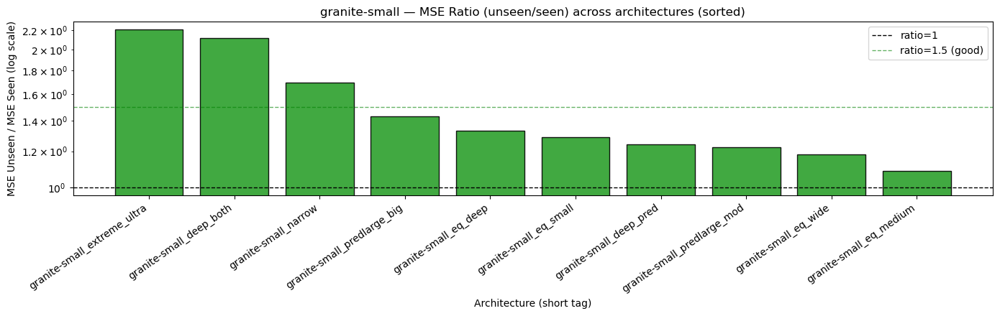

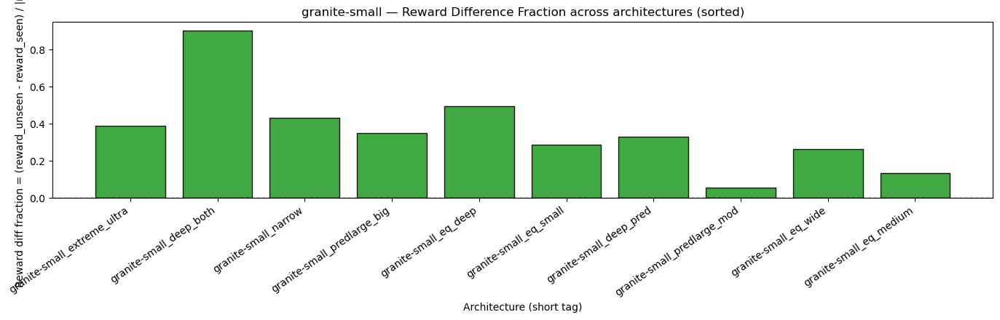

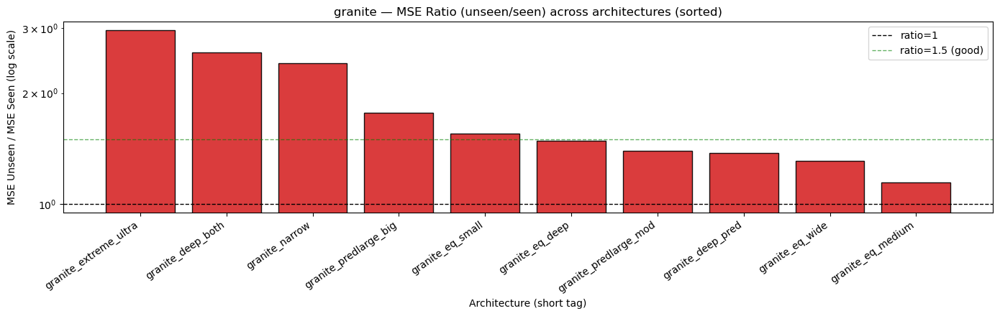

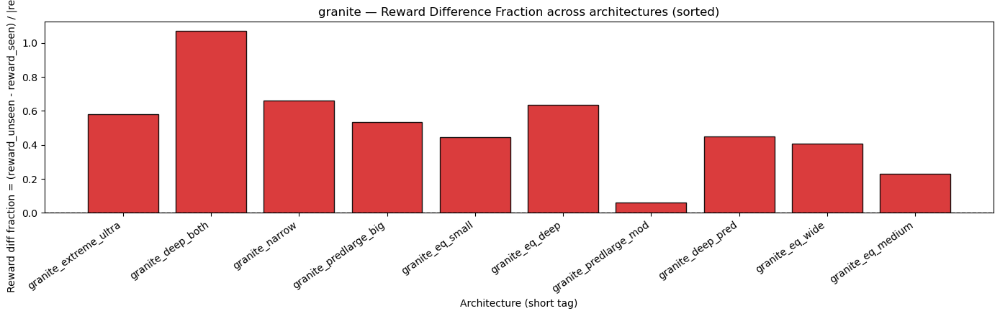

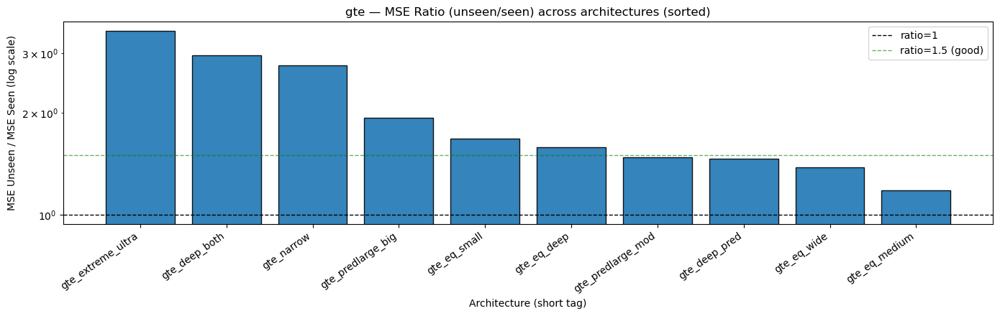

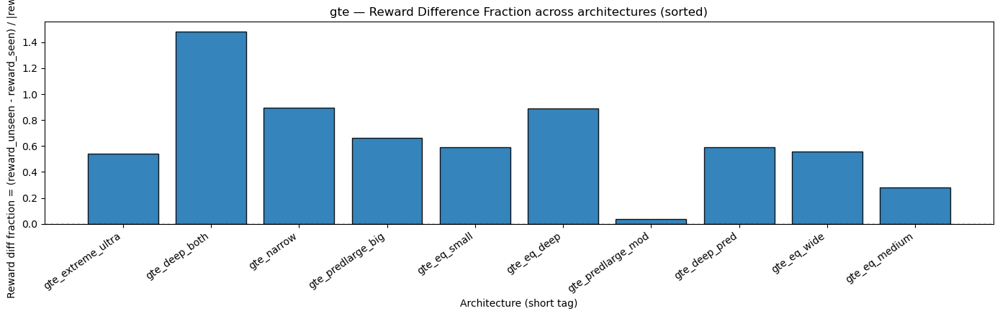

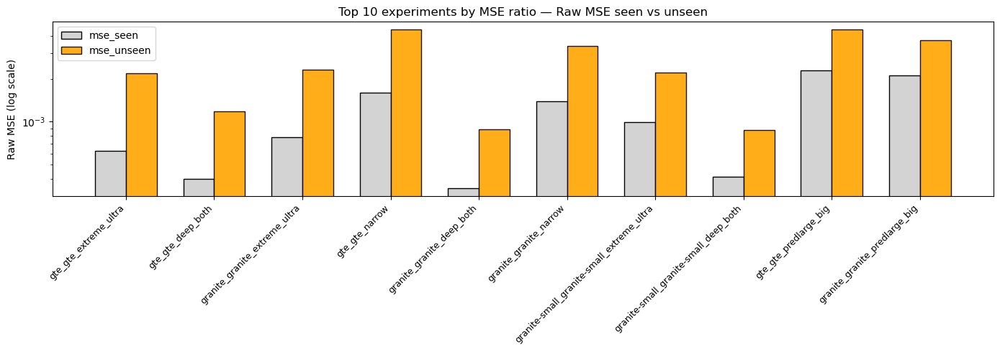

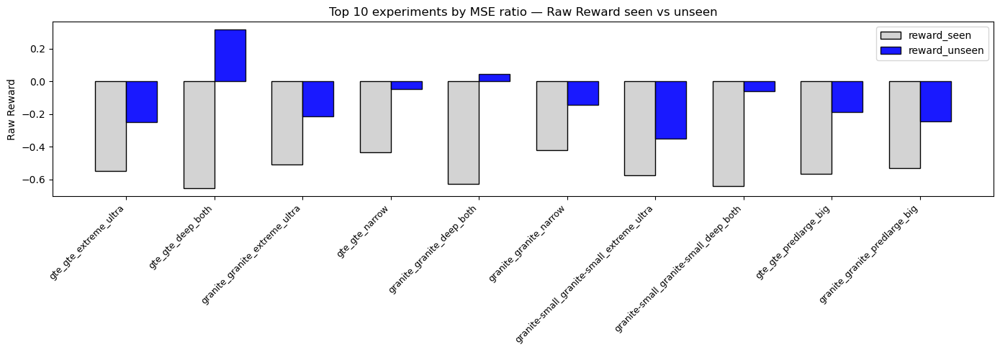

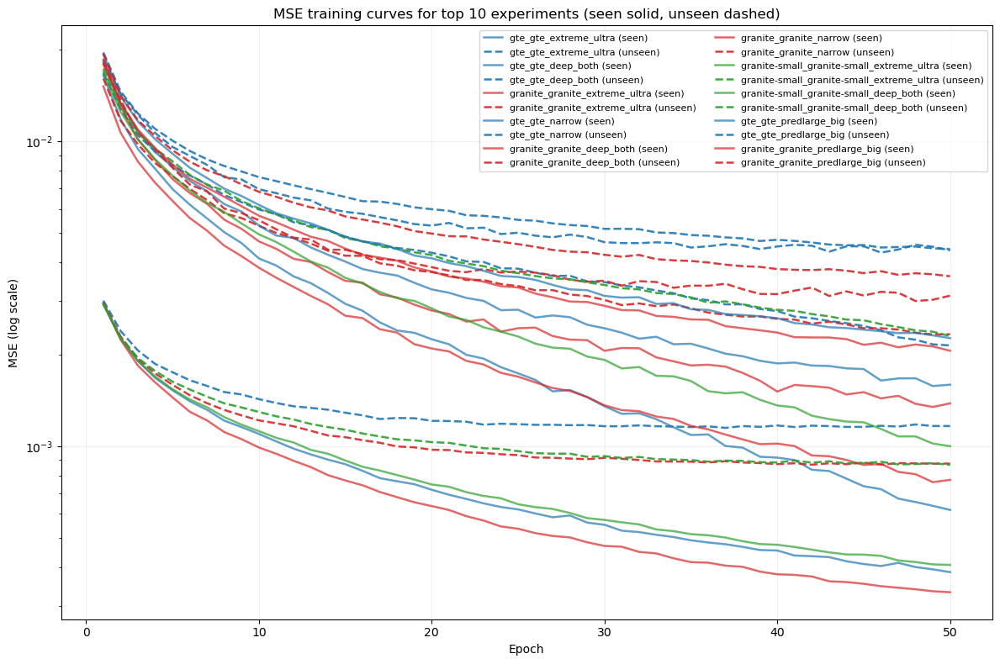

## Top 5 by MSE Ratio (unseen/seen)

,experiment_name,encoder,arch_tag,mse_seen,mse_unseen,mse_ratio,std_seen
20,gte_gte_extreme_ultra,gte,gte_extreme_ultra,0.000624,0.002179,3.493326,0.000018
27,gte_gte_deep_both,gte,gte_deep_both,0.000397,0.001178,2.964030,0.000012
10,granite_granite_extreme_ultra,granite,granite_extreme_ultra,0.000780,0.002304,2.954647,0.000024
23,gte_gte_narrow,gte,gte_narrow,0.001588,0.004398,2.769387,0.000121
17,granite_granite_deep_both,granite,granite_deep_both,0.000342,0.000883,2.580610,0.000012


## Top 5 by Reward Diff Fraction

,experiment_name,encoder,arch_tag,reward_seen,reward_unseen,reward_diff_frac,std_seen
27,gte_gte_deep_both,gte,gte_deep_both,-0.654427,0.316219,1.483200,0.000012
17,granite_granite_deep_both,granite,granite_deep_both,-0.625995,0.044954,1.071812,0.000012
7,granite-small_granite-small_deep_both,granite-small,granite-small_deep_both,-0.642367,-0.061498,0.904264,0.000014
23,gte_gte_narrow,gte,gte_narrow,-0.433668,-0.045961,0.894017,0.000121
28,gte_gte_eq_deep,gte,gte_eq_deep,-0.583733,-0.065054,0.888556,0.000027


Saved plots and CSVs to results/.


In [30]:
# Paste this entire block into a notebook cell
import json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

plt.rcParams.update({'figure.max_open_warning': 0})

# ----------------- Config / file paths -----------------
summary_path = Path('results/precomp_all_experiments_summary.json')
out_csv = Path('results/summary_table_enhanced.csv')
out_dir = Path('results')
out_dir.mkdir(parents=True, exist_ok=True)

eps = 1e-9

# ----------------- Architecture definitions (from your arch_configs) -----------------
# Use the same tags you ran experiments with (full tag including _t..). We'll derive short tag.
arch_configs = [
    ((256, 64),   (256, 64),   "eq_medium_t64-p64"),
    ((128, 8),   (128, 8),   "eq_small_t8-p8"),
    ((512, 64),   (512, 64),   "eq_wide_t64-p64"),
    ((512, 256, 64), (512, 256, 64), "eq_deep_t64-p64"),
    ((128, 64),   (512, 64),   "predlarge_mod_t64-p64"),
    ((256, 64),   (1024, 64),  "predlarge_big_t64-p64"),
    ((128, 64),   (2048, 64),  "extreme_ultra_t64-p64"),
    ((256, 64),   (512, 256, 64), "deep_pred_t64-p64"),
    ((512, 256, 64), (1024, 512, 64), "deep_both_t64-p64"),
    ((128, 8),    (256, 8),    "narrow_t8-p8")
]

# Derive short tag and mapping
ARCH_TAGS_FULL = [t for (_, _, t) in arch_configs]
ARCH_TAGS_SHORT = [t.split('_t')[0] for t in ARCH_TAGS_FULL]
ARCH_FULL_TO_SHORT = {full: short for full, short in zip(ARCH_TAGS_FULL, ARCH_TAGS_SHORT)}

# Map exact (target_tuple, predictor_tuple) -> short_tag for fast lookup
LAYERS_TO_TAG = {}
for (T, P, full_tag) in arch_configs:
    short = ARCH_FULL_TO_SHORT[full_tag]
    # ensure canonical tuple of ints
    Tt = tuple(int(x) for x in T)
    Pt = tuple(int(x) for x in P)
    LAYERS_TO_TAG[(Tt, Pt)] = short

# Helper: canonicalize a layer object (list/tuple/string) -> tuple of ints
def _to_layer_tuple(x):
    # if already list/tuple of ints
    if isinstance(x, (list, tuple)):
        return tuple(int(i) for i in x)
    # if string like "(256, 64)" or "256_64" or "['256', '64']"
    if isinstance(x, str):
        # try common separators
        for sep in [',', '_', ' ']:
            if sep in x:
                parts = [p.strip().strip("()[]'\"") for p in x.split(sep) if p.strip()]
                try:
                    return tuple(int(intpart) for intpart in parts)
                except Exception:
                    continue
        # last resort: try to eval safely (literal_eval)
        try:
            import ast
            node = ast.literal_eval(x)
            if isinstance(node, (list, tuple)):
                return tuple(int(i) for i in node)
        except Exception:
            pass
    # fallback: empty tuple
    return tuple()

# New robust function: get short tag from hyperparameters dict
def extract_short_tag(hp: dict):
    """
    hp: hyperparameters dict expected to contain 'target_layers' and 'predictor_layers'
    Returns short_tag (e.g., 'eq_medium') or 'unknown'
    """
    encoder_name = hp.get('encoder_name', hp.get('encoder', 'unknown'))
    T_raw = hp.get('target_layers', hp.get('target', hp.get('T', ())))
    P_raw = hp.get('predictor_layers', hp.get('predictor', hp.get('P', ())))
    Tt = _to_layer_tuple(T_raw)
    Pt = _to_layer_tuple(P_raw)

    # exact match
    if (Tt, Pt) in LAYERS_TO_TAG:
        return encoder_name + '_' + LAYERS_TO_TAG[(Tt, Pt)]

    # fallback: return a name built from layers (so nothing is lost)
    # e.g., "T256-64_P512-64"
    if Tt or Pt:
        tstr = "T" + "-".join(str(x) for x in Tt) if Tt else "T?"
        pstr = "P" + "-".join(str(x) for x in Pt) if Pt else "P?"
        return f"{encoder_name}_{tstr}_{pstr}"

    return 'unknown'

# ----------------- Load results -----------------
if not summary_path.exists():
    raise FileNotFoundError(f"Results file not found: {summary_path}. Run experiments first.")
with open(summary_path, 'r') as f:
    all_results = json.load(f)
print(f"Loaded {len(all_results)} experiments from {summary_path}")

# ----------------- Print architecture map once -----------------
display(Markdown("### Architecture mapping (short tag -> (target_layers, predictor_layers))"))
md_lines = []
for short_tag, (T, P) in ARCH_LAYER_MAP.items():
    md_lines.append(f"- **{short_tag}** : Target={T}  Predictor={P}")
display(Markdown("\n".join(md_lines)))

# ----------------- Build dataframe rows -----------------
rows = []
for res in all_results:
    hp = res.get('hyperparameters', {})
    test = res.get('test_results', {})
    mse = test.get('mse', {})
    rewards = test.get('rewards', {})

    # Original experiment name might vary; use given experiment_name if present
    exp_raw_name = res.get('experiment_name', res.get('name', 'unknown'))
    encoder = hp.get('encoder_name', hp.get('encoder', 'unknown'))

    # derive architecture short tag
    short_tag = extract_short_tag(res.get('hyperparameters', {}))
    # canonical experiment display name: encoder_shorttag (e.g. gte_eq_medium)
    exp_display_name = f"{encoder}_{short_tag}"

    # layer strings (safety)
    target_layers = tuple(hp.get('target_layers', ()))
    predictor_layers = tuple(hp.get('predictor_layers', ()))
    arch_label = f"{short_tag} ({'_'.join(str(x) for x in target_layers)} / {'_'.join(str(x) for x in predictor_layers)})"

    # raw metrics (safe convert)
    mse_seen = float(mse.get('seen_mean', np.nan))
    mse_unseen = float(mse.get('unseen_mean', np.nan))
    mse_random = float(mse.get('random_mean', np.nan))
    std_seen = float(mse.get('seen_std', np.nan))
    std_unseen = float(mse.get('unseen_std', np.nan))
    std_random = float(mse.get('random_std', np.nan))

    reward_seen = float(rewards.get('seen_mean', np.nan))
    reward_unseen = float(rewards.get('unseen_mean', np.nan))
    reward_random = float(rewards.get('random_mean', np.nan))

    # derived metrics
    mse_ratio = (mse_unseen + eps) / (mse_seen + eps)
    mse_diff_frac = (mse_unseen - mse_seen) / (abs(mse_seen) + eps)   # high-school style
    # also random vs unseen and random vs seen
    mse_random_vs_seen_ratio = (mse_random + eps) / (mse_seen + eps)
    mse_unseen_vs_random_ratio = (mse_unseen + eps) / (mse_random + eps)

    # reward equivalents (note: reward may be negative depending on your formulation)
    reward_ratio = (reward_unseen + eps) / (reward_seen + eps)
    reward_diff = reward_unseen - reward_seen
    reward_diff_frac = reward_diff / (abs(reward_seen) + eps)
    reward_random_vs_seen_ratio = (reward_random + eps) / (reward_seen + eps)
    reward_unseen_vs_random_ratio = (reward_unseen + eps) / (reward_random + eps)

    # training logs: lists for plotting
    logs = res.get('training_logs', {})
    mse_seen_epochs = np.array(logs.get('epoch_mse_s1', []), dtype=float)
    mse_unseen_epochs = np.array(logs.get('epoch_mse_s3', []), dtype=float)
    reward_seen_epochs = np.array(logs.get('epoch_rewards_s1', []), dtype=float)
    reward_unseen_epochs = np.array(logs.get('epoch_rewards_s3', []), dtype=float)
    training_losses = np.array(logs.get('training_losses', []), dtype=float)

    rows.append({
        # identity
        'experiment_name_raw': exp_raw_name,
        'experiment_name': exp_display_name,
        'encoder': encoder,
        'arch_tag': short_tag,
        'arch_label': arch_label,
        'target_layers': str(target_layers),
        'predictor_layers': str(predictor_layers),

        # core derived (visible)
        'mse_ratio': mse_ratio,
        'mse_diff_frac': mse_diff_frac,
        'reward_diff_frac': reward_diff_frac,
        'std_seen': std_seen,

        # raw metrics (place towards end)
        'mse_seen': mse_seen,
        'mse_unseen': mse_unseen,
        'mse_random': mse_random,
        'std_unseen': std_unseen,
        'std_random': std_random,

        'reward_seen': reward_seen,
        'reward_unseen': reward_unseen,
        'reward_random': reward_random,

        # extra ratios
        'mse_random_vs_seen_ratio': mse_random_vs_seen_ratio,
        'mse_unseen_vs_random_ratio': mse_unseen_vs_random_ratio,
        'reward_random_vs_seen_ratio': reward_random_vs_seen_ratio,
        'reward_unseen_vs_random_ratio': reward_unseen_vs_random_ratio,

        # training curves for plotting (store as lists)
        'mse_seen_epochs': mse_seen_epochs.tolist(),
        'mse_unseen_epochs': mse_unseen_epochs.tolist(),
        'reward_seen_epochs': reward_seen_epochs.tolist(),
        'reward_unseen_epochs': reward_unseen_epochs.tolist(),
        'training_losses': training_losses.tolist()
    })

# create DataFrame
df_full = pd.DataFrame(rows)

# Reorder columns: core columns first, then raw/extra columns at the end
core_cols = ['experiment_name','encoder','arch_tag','arch_label','target_layers','predictor_layers',
             'mse_ratio','mse_diff_frac','reward_diff_frac','std_seen']
raw_cols = ['mse_seen','mse_unseen','mse_random','std_unseen','std_random',
            'reward_seen','reward_unseen','reward_random']
extra_cols = ['mse_random_vs_seen_ratio','mse_unseen_vs_random_ratio','reward_random_vs_seen_ratio','reward_unseen_vs_random_ratio']
plot_cols = ['mse_seen_epochs','mse_unseen_epochs','reward_seen_epochs','reward_unseen_epochs','training_losses']
df = df_full[core_cols + raw_cols + extra_cols + plot_cols]

# display main dataframe in notebook (compact)
display(Markdown("## Summary table (core metrics visible). Scroll horizontally for raw/extra columns"))
display(df)

# Save summary CSV (full)
df_full.to_csv(out_csv, index=False)
print(f"Saved full CSV to: {out_csv}")

# ----------------- Plot settings -----------------
palette = {'gte':'#1f77b4','granite':'#d62728','granite-small':'#2ca02c'}
encoders_unique = df['encoder'].unique().tolist()

# For each encoder, plot all architectures (>=10 bars)
for enc in encoders_unique:
    enc_df = df[df['encoder'] == enc].copy().reset_index(drop=True)
    enc_df = enc_df.sort_values('mse_ratio', ascending=False).reset_index(drop=True)

    # bar plot: MSE ratio (unseen/seen)
    plt.figure(figsize=(14,4.5))
    bars = plt.bar(enc_df['arch_tag'], enc_df['mse_ratio'], color=palette.get(enc, '#777777'), edgecolor='black', alpha=0.9)
    plt.yscale('log')
    plt.axhline(1.0, color='black', linestyle='--', linewidth=1, label='ratio=1')
    plt.axhline(1.5, color='green', linestyle='--', linewidth=1, alpha=0.6, label='ratio=1.5 (good)')
    plt.ylabel('MSE Unseen / MSE Seen (log scale)')
    plt.xlabel('Architecture (short tag)')
    plt.title(f'{enc} — MSE Ratio (unseen/seen) across architectures (sorted)')
    plt.xticks(rotation=35, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.savefig(out_dir / f'{enc}_mse_ratio_bars.png', dpi=150, bbox_inches='tight')
    plt.show()

    # reward diff fraction bar
    plt.figure(figsize=(14,4.5))
    plt.bar(enc_df['arch_tag'], enc_df['reward_diff_frac'], color=palette.get(enc, '#777777'), edgecolor='black', alpha=0.9)
    plt.axhline(0.0, color='black', linestyle='--', linewidth=1)
    plt.ylabel('Reward diff fraction = (reward_unseen - reward_seen) / |reward_seen|')
    plt.xlabel('Architecture (short tag)')
    plt.title(f'{enc} — Reward Difference Fraction across architectures (sorted)')
    plt.xticks(rotation=35, ha='right')
    plt.tight_layout()
    plt.savefig(out_dir / f'{enc}_reward_diff_frac_bars.png', dpi=150, bbox_inches='tight')
    plt.show()

# ----------------- Combined raw comparison plot (show top 10 overall by mse_ratio) -----------------
topN = 10
top_df = df.sort_values('mse_ratio', ascending=False).head(topN).reset_index(drop=True)
x = np.arange(len(top_df))
width = 0.35

plt.figure(figsize=(14,5))
plt.bar(x - width/2, top_df['mse_seen'], width=width, label='mse_seen', color='lightgray', edgecolor='black')
plt.bar(x + width/2, top_df['mse_unseen'], width=width, label='mse_unseen', color='orange', edgecolor='black', alpha=0.9)
plt.yscale('log')
plt.xticks(x, top_df['experiment_name'], rotation=45, ha='right', fontsize=9)
plt.ylabel('Raw MSE (log scale)')
plt.title(f'Top {topN} experiments by MSE ratio — Raw MSE seen vs unseen')
plt.legend()
plt.tight_layout()
plt.savefig(out_dir / f'top{topN}_raw_mse_seen_unseen.png', dpi=150, bbox_inches='tight')
plt.show()

# also plot reward on linear scale
plt.figure(figsize=(14,5))
plt.bar(x - width/2, top_df['reward_seen'], width=width, label='reward_seen', color='lightgray', edgecolor='black')
plt.bar(x + width/2, top_df['reward_unseen'], width=width, label='reward_unseen', color='blue', edgecolor='black', alpha=0.9)
plt.xticks(x, top_df['experiment_name'], rotation=45, ha='right', fontsize=9)
plt.ylabel('Raw Reward')
plt.title(f'Top {topN} experiments by MSE ratio — Raw Reward seen vs unseen')
plt.legend()
plt.tight_layout()
plt.savefig(out_dir / f'top{topN}_raw_reward_seen_unseen.png', dpi=150, bbox_inches='tight')
plt.show()

# ----------------- Line plots: training curves for top experiments (distinct colors per encoder; dashed for unseen) -----------------
topk = 10
top_exps = df.sort_values('mse_ratio', ascending=False).head(topk)
plt.figure(figsize=(12,8))
for idx, row in top_exps.iterrows():
    color = palette.get(row['encoder'], '#777777')
    me = np.array(row['mse_seen_epochs'], dtype=float)
    mu = np.array(row['mse_unseen_epochs'], dtype=float)
    epochs = np.arange(1, max(len(me), len(mu)) + 1)
    me_p = np.pad(me, (0, max(0, len(epochs) - len(me))), constant_values=np.nan)
    mu_p = np.pad(mu, (0, max(0, len(epochs) - len(mu))), constant_values=np.nan)
    label_seen = f"{row['experiment_name']} (seen)"
    label_unseen = f"{row['experiment_name']} (unseen)"
    # solid for seen, dashed for unseen; same color
    plt.plot(epochs, me_p, linestyle='-', color=color, alpha=0.7, linewidth=1.8, label=label_seen)
    plt.plot(epochs, mu_p, linestyle='--', color=color, alpha=0.9, linewidth=1.8, label=label_unseen)

plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('MSE (log scale)')
plt.title(f'MSE training curves for top {topk} experiments (seen solid, unseen dashed)')
plt.legend(fontsize=8, ncol=2)
plt.grid(alpha=0.2)
plt.tight_layout()
plt.savefig(out_dir / f'top{topk}_mse_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

# ----------------- Print compact textual summary (top 5 by mse_ratio and top 5 by reward_diff_frac) -----------------
display(Markdown("## Top 5 by MSE Ratio (unseen/seen)"))
display(df.sort_values('mse_ratio', ascending=False)[['experiment_name','encoder','arch_tag','mse_seen','mse_unseen','mse_ratio','std_seen']].head(5))

display(Markdown("## Top 5 by Reward Diff Fraction"))
display(df.sort_values('reward_diff_frac', ascending=False)[['experiment_name','encoder','arch_tag','reward_seen','reward_unseen','reward_diff_frac','std_seen']].head(5))

print("Saved plots and CSVs to results/.")


'128_64'